# Detecção de Mudanças no Regime Climático Distrital em Moçambique

Nas últimas décadas, diversos estudos têm apontado para alterações nos padrões climáticos globais. Contudo, identificar mudanças climáticas não consiste apenas em observar aumentos ou diminuições da precipitação média. Em muitos casos, o comportamento climático pode sofrer mudanças estruturais abruptas, conhecidas como mudanças de regime climático (Climate Regime Shifts), nas quais o sistema passa a apresentar características diferentes das observadas anteriormente. 

Este projecto utiliza dados de precipitação distrital cobrindo o período de 1981 a 2025 para avaliar tendências climáticas e detectar possíveis rupturas nos padrões históricos de precipitação. Para tal, são aplicadas técnicas de análise exploratória de dados, regressão linear, regressão robusta de Huber, teste de Mann-Kendall e teste de Pettitt, permitindo identificar a existência de tendências significativas e os períodos em que ocorreram mudanças estruturais no comportamento climático.  

## Objectivo Geral

Analisar a evolução espacial e temporal da precipitação em Moçambique e detectar possíveis mudanças de regime climático nos distritos do país através de técnicas estatísticas de análise de tendências e detecção de rupturas.

## Objectivos Específicos

* Avaliar a qualidade e consistência dos dados históricos de precipitação utilizados no estudo.

* Caracterizar o comportamento espacial da precipitação entre províncias e distritos.

* Identificar os distritos mais e menos chuvosos de cada província.

* Analisar a distribuição sazonal das chuvas ao longo do território nacional.

* Avaliar a existência de tendências temporais na precipitação utilizando regressão linear, regressão Huber e o teste de Mann-Kendall.

* Detectar mudanças estruturais nas séries temporais de precipitação através do teste de Pettitt.

* Identificar os distritos que apresentam evidências estatisticamente significativas de alteração do regime climático.

---

<img src="../assets/capa ii.png">

---

# *I. Base*

### Bibliotecas usadas

In [174]:
# Bibliotecas
import os
import warnings

warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.metrics import (
    r2_score,
    mean_squared_error,
    mean_absolute_error
)

from scipy import stats

import pymannkendall as mk
import pyhomogeneity as hg

### Funções principais

In [175]:
def analisar_qualidade(df, df_caminho):
    """
    Realiza uma análise básica da qualidade de um dataset,
    apresentando informações sobre dimensões, uso de memória,
    valores ausentes, duplicados, tipos de dados e estatísticas
    descritivas das colunas numéricas.
    """
    
    # Dimensões básicas
    total_linhas = df.shape[0]
    total_colunas = df.shape[1]
    total_celulas = total_linhas * total_colunas
    
    # Tamanho em memória
    tamanho_mb_dico = os.path.getsize(df_caminho) / 1024**2
    tamanho_mb_memoria = df.memory_usage(deep=True).sum() / (1024 ** 2)
    
    
    # Valores ausentes
    valores_ausentes = df.isnull().sum().sum()
    percentagem_ausentes = (valores_ausentes / total_celulas) * 100
    
    # Duplicados
    duplicados = df.duplicated().sum()
    percentagem_duplicados = (duplicados / total_linhas) * 100
    
    # Dados válidos
    dados_validos = total_celulas - valores_ausentes
    percentagem_validos = (dados_validos / total_celulas) * 100
    
    # Linhas completas (sem valores ausentes)
    linhas_completas = df.dropna().shape[0]
    percentagem_linhas_completas = (linhas_completas / total_linhas) * 100
    
    # Linhas incompletas (com valores ausentes)
    linhas_incompletas = total_linhas - linhas_completas
    percentagem_linhas_incompletas = (linhas_incompletas / total_linhas) * 100
    
    # EXIBIÇÃO DE RESULTADOS
    print("=" * 70)
    print("ANÁLISE DE QUALIDADE DO DATASET")
    print("=" * 70)
    
    # Detalhes gerais
    print("\n DETALHES GERAIS")
    print("-" * 70)
    print(f"Total de linhas: {total_linhas:,}")
    print(f"Total de colunas: {total_colunas}")
    print(f"Total de células: {total_celulas:,}")
    print(f"Tamanho do dataset (em disco): {tamanho_mb_dico:.1f} MB")
    print(f"Tamanho do dataset (em memória): {tamanho_mb_memoria:.1f} MB")
    
    # Tabela de métricas principais
    print("\n RESUMO DA QUALIDADE DOS DADOS")
    print("-" * 70)
    
    metricas = pd.DataFrame({
        "Métrica": [
            "Valores ausentes",
            "Duplicados",
            "Dados válidos",
            "Linhas completas",
            "Linhas incompletas"
        ],
        "Quantidade": [
            valores_ausentes,
            duplicados,
            dados_validos,
            linhas_completas,
            linhas_incompletas
        ],
        "Percentagem (%)": [
            f"{percentagem_ausentes:.1f}%",
            f"{percentagem_duplicados:.1f}%",
            f"{percentagem_validos:.1f}%",
            f"{percentagem_linhas_completas:.1f}%",
            f"{percentagem_linhas_incompletas:.1f}%"
        ]
    })
    
    print(metricas.to_string(index=False))
    
    # Valores ausentes por coluna
    print("\n VALORES AUSENTES POR COLUNA")
    print("-" * 70)
    
    ausentes_coluna = df.isnull().sum()
    percentagem_coluna = (ausentes_coluna / total_linhas) * 100
    
    tabela_ausentes = pd.DataFrame({
        "Coluna": df.columns,
        "Valores Ausentes": ausentes_coluna.values,
        "Percentagem (%)": [f"{p:.1f}%" for p in percentagem_coluna.values]
    })
    
    print(tabela_ausentes.to_string(index=False))
    
    # Tipos de dados
    print("\n TIPOS DE DADOS")
    print("-" * 70)
    print(df.dtypes)
    
    # Estatísticas descritivas (apenas colunas numéricas)
    print("\n ESTATÍSTICAS DESCRITIVAS (COLUNAS NUMÉRICAS)")
    print("-" * 70)
    print(df.describe().to_string())

# ============================================================================================

def evolucao_chuva_distritos_prov(df, ids_dict):
    """
    Gera gráficos individuais da evolução anual da precipitação
    para os distritos mais e menos chuvosos de cada província.
    
    Parameters
    ----------
    df : pandas.DataFrame
    
    ids_dict : dict
        Dicionário contendo:
        - 'ids_mais_chuvo' : list
            IDs dos distritos mais chuvosos (um por província)
        - 'ids_menos_chuvo' : list
            IDs dos distritos menos chuvosos (um por província)
    
    --------
    """
    
    # Validação de entrada
    colunas_obrigatorias = ['provincia', 'distrito', 'cod_distrito', 'ano', 'chuva_1m']
    if not all(col in df.columns for col in colunas_obrigatorias):
        raise ValueError(f"DataFrame deve conter as colunas: {colunas_obrigatorias}")
    
    # Validar dicionário de IDs
    if 'ids_mais_chuvo' not in ids_dict or 'ids_menos_chuvo' not in ids_dict:
        raise ValueError("ids_dict deve conter as chaves: 'ids_mais_chuvo' e 'ids_menos_chuvo'")
    
    # Remover valores nulos
    df_limpo = df.dropna(subset=colunas_obrigatorias)
    
    # Obter lista de províncias (ordenada)
    provincias = sorted(df_limpo['provincia'].unique())
    n_provincias = len(provincias)
    
    # Calcular dimensões da grid (aproximadamente quadrada)
    n_cols = int(np.ceil(np.sqrt(n_provincias)))
    n_rows = int(np.ceil(n_provincias / n_cols))
    
    # Criar figura com subplots
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(28, 16))
    fig.suptitle('Evolução Anual da Precipitação: Distritos Mais e Menos Chuvosos por Província', 
                 fontsize=18, fontweight='bold', y=0.995)
    
    # Achatar array de axes para iteração mais fácil
    axes = axes.flatten()
    
    # Cores para mais e menos chuvoso
    cor_mais_chuvo = '#1f77b4'  # Azul
    cor_menos_chuvo = '#ff7f0e'  # Laranja
    
    # Processar cada província
    for idx, provincia in enumerate(provincias):
        ax = axes[idx]
        
        # Filtrar dados para a província atual
        df_provincia = df_limpo[df_limpo['provincia'] == provincia].copy()
        
        # Obter IDs do distrito mais e menos chuvoso para esta província
        id_mais = ids_dict['ids_mais_chuvo'][idx]
        id_menos = ids_dict['ids_menos_chuvo'][idx]
        
        # Filtrar dados para os dois distritos
        df_mais_chuvo = df_provincia[df_provincia['cod_distrito'] == id_mais].copy()
        df_menos_chuvo = df_provincia[df_provincia['cod_distrito'] == id_menos].copy()
        
        # Agrupar por ano e calcular média anual
        df_mais_chuvo_anual = df_mais_chuvo.groupby('ano')['chuva_1m'].mean().reset_index()
        df_menos_chuvo_anual = df_menos_chuvo.groupby('ano')['chuva_1m'].mean().reset_index()
        
        # Criar índice numérico para o eixo X
        x_mais = np.arange(len(df_mais_chuvo_anual))
        x_menos = np.arange(len(df_menos_chuvo_anual))
        
        # Nomes dos distritos
        nome_mais = df_mais_chuvo['distrito'].iloc[0] if len(df_mais_chuvo) > 0 else "Desconhecido"
        nome_menos = df_menos_chuvo['distrito'].iloc[0] if len(df_menos_chuvo) > 0 else "Desconhecido"
        
        # Plotar linha para distrito mais chuvoso
        ax.plot(x_mais, df_mais_chuvo_anual['chuva_1m'], 
                color=cor_mais_chuvo, linewidth=2.5, marker='o', markersize=8,
                label=f'Mais Chuvoso: {nome_mais}', zorder=2)
        
        # Plotar linha para distrito menos chuvoso
        ax.plot(x_menos, df_menos_chuvo_anual['chuva_1m'], 
                color=cor_menos_chuvo, linewidth=2.5, marker='o', markersize=8,
                label=f'Menos Chuvoso: {nome_menos}', zorder=2)
        
        # Encontrar mínimos e máximos para o distrito mais chuvoso
        if len(df_mais_chuvo_anual) > 0:
            min_idx_mais = df_mais_chuvo_anual['chuva_1m'].idxmin()
            max_idx_mais = df_mais_chuvo_anual['chuva_1m'].idxmax()
            
            # Anotação do mínimo (mais chuvoso)
            ax.annotate(f"Mín: {df_mais_chuvo_anual.loc[min_idx_mais, 'chuva_1m']:.1f}mm", 
                        xy=(x_mais[min_idx_mais], df_mais_chuvo_anual.loc[min_idx_mais, 'chuva_1m']),
                        xytext=(0, -20), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_mais_chuvo, alpha=0.7),
                        ha='center', fontsize=8, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_mais_chuvo, lw=1.5))
            
            # Anotação do máximo (mais chuvoso)
            ax.annotate(f"Máx: {df_mais_chuvo_anual.loc[max_idx_mais, 'chuva_1m']:.1f}mm", 
                        xy=(x_mais[max_idx_mais], df_mais_chuvo_anual.loc[max_idx_mais, 'chuva_1m']),
                        xytext=(0, 15), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_mais_chuvo, alpha=0.7),
                        ha='center', fontsize=8, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_mais_chuvo, lw=1.5))
        
        # Encontrar mínimos e máximos para o distrito menos chuvoso
        if len(df_menos_chuvo_anual) > 0:
            min_idx_menos = df_menos_chuvo_anual['chuva_1m'].idxmin()
            max_idx_menos = df_menos_chuvo_anual['chuva_1m'].idxmax()
            
            # Anotação do mínimo (menos chuvoso)
            ax.annotate(f"Mín: {df_menos_chuvo_anual.loc[min_idx_menos, 'chuva_1m']:.1f}mm", 
                        xy=(x_menos[min_idx_menos], df_menos_chuvo_anual.loc[min_idx_menos, 'chuva_1m']),
                        xytext=(0, -20), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.4', facecolor=cor_menos_chuvo, alpha=0.7),
                        ha='center', fontsize=8, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_menos_chuvo, lw=1.5))
            
            # Anotação do máximo (menos chuvoso)
            ax.annotate(f"Máx: {df_menos_chuvo_anual.loc[max_idx_menos, 'chuva_1m']:.1f}mm", 
                        xy=(x_menos[max_idx_menos], df_menos_chuvo_anual.loc[max_idx_menos, 'chuva_1m']),
                        xytext=(0, 15), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.4', facecolor=cor_menos_chuvo, alpha=0.7),
                        ha='center', fontsize=8, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_menos_chuvo, lw=1.5))
        
        # Personalizar subplot
        ax.set_title(provincia, fontsize=12, fontweight='bold', pad=10)
        ax.set_xlabel('Ano', fontsize=10, fontweight='bold')
        ax.set_ylabel('Precipitação Média Anual (mm)', fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='best', fontsize=9, framealpha=0.9)
        ax.set_axisbelow(True)
        
        # Configurar eixo X com os anos
        anos_mais = df_mais_chuvo_anual['ano'].astype(int).values
        anos_menos = df_menos_chuvo_anual['ano'].astype(int).values
        
        # Usar todos os anos únicos
        todos_anos = sorted(set(list(anos_mais) + list(anos_menos)))
        x_numeric = np.arange(len(todos_anos))
        
        ax.set_xticks(x_numeric)
        ax.set_xticklabels(todos_anos, rotation=90)
    
    # Remover subplots vazios
    for idx in range(n_provincias, len(axes)):
        fig.delaxes(axes[idx])
    
    plt.tight_layout()
    plt.show()

# ============================================================================================
def evolucao_chuva_distritos_prov_separados(df, ids_dict):
    """
    Gera gráficos individuais da evolução anual da precipitação
    para os distritos mais e menos chuvosos de cada província.
    Cada província tem seu próprio gráfico separado.
    
    Parameters
    ----------
    df : pandas.DataFrame
    
    ids_dict : dict
        Dicionário contendo:
        - 'ids_mais_chuvo' : list
            IDs dos distritos mais chuvosos (um por província)
        - 'ids_menos_chuvo' : list
            IDs dos distritos menos chuvosos (um por província)
    
    -------
    """
    
    # Validação de entrada
    colunas_obrigatorias = ['provincia', 'distrito', 'cod_distrito', 'ano', 'chuva_1m']
    if not all(col in df.columns for col in colunas_obrigatorias):
        raise ValueError(f"DataFrame deve conter as colunas: {colunas_obrigatorias}")
    
    # Validar dicionário de IDs
    if 'ids_mais_chuvo' not in ids_dict or 'ids_menos_chuvo' not in ids_dict:
        raise ValueError("ids_dict deve conter as chaves: 'ids_mais_chuvo' e 'ids_menos_chuvo'")
    
    # Remover valores nulos
    df_limpo = df.dropna(subset=colunas_obrigatorias)
    
    # Obter lista de províncias (ordenada)
    provincias = sorted(df_limpo['provincia'].unique())
    
    # Cores para mais e menos chuvoso
    cor_mais_chuvo = '#1f77b4'  # Azul
    cor_menos_chuvo = '#ff7f0e'  # Laranja
    
    # Configurar estilo
    plt.style.use('seaborn-v0_8-darkgrid')
    
    # Processar cada província
    for idx, provincia in enumerate(provincias):
        # Criar figura separada para cada província
        fig, ax = plt.subplots(figsize=(18, 7))
        
        # Filtrar dados para a província atual
        df_provincia = df_limpo[df_limpo['provincia'] == provincia].copy()
        
        # Obter IDs do distrito mais e menos chuvoso para esta província
        id_mais = ids_dict['ids_mais_chuvo'][idx]
        id_menos = ids_dict['ids_menos_chuvo'][idx]
        
        # Filtrar dados para os dois distritos
        df_mais_chuvo = df_provincia[df_provincia['cod_distrito'] == id_mais].copy()
        df_menos_chuvo = df_provincia[df_provincia['cod_distrito'] == id_menos].copy()
        
        # Agrupar por ano e calcular média anual
        df_mais_chuvo_anual = df_mais_chuvo.groupby('ano')['chuva_1m'].mean().reset_index()
        df_menos_chuvo_anual = df_menos_chuvo.groupby('ano')['chuva_1m'].mean().reset_index()
        
        # Criar índice numérico para o eixo X
        x_mais = np.arange(len(df_mais_chuvo_anual))
        x_menos = np.arange(len(df_menos_chuvo_anual))
        
        # Nomes dos distritos
        nome_mais = df_mais_chuvo['distrito'].iloc[0] if len(df_mais_chuvo) > 0 else "Desconhecido"
        nome_menos = df_menos_chuvo['distrito'].iloc[0] if len(df_menos_chuvo) > 0 else "Desconhecido"
        
        # Plotar linha para distrito mais chuvoso
        ax.plot(x_mais, df_mais_chuvo_anual['chuva_1m'], 
                color=cor_mais_chuvo, linewidth=2.5, marker='o', markersize=8,
                label=f'Mais Chuvoso: {nome_mais}', zorder=2)
        
        # Plotar linha para distrito menos chuvoso
        ax.plot(x_menos, df_menos_chuvo_anual['chuva_1m'], 
                color=cor_menos_chuvo, linewidth=2.5, marker='o', markersize=8,
                label=f'Menos Chuvoso: {nome_menos}', zorder=2)
        
        # Encontrar mínimos e máximos para o distrito mais chuvoso
        if len(df_mais_chuvo_anual) > 0:
            min_idx_mais = df_mais_chuvo_anual['chuva_1m'].idxmin()
            max_idx_mais = df_mais_chuvo_anual['chuva_1m'].idxmax()
            
            # Anotação do mínimo (mais chuvoso) - COM BACKGROUND
            ax.annotate(f"Mín: {df_mais_chuvo_anual.loc[min_idx_mais, 'chuva_1m']:.1f}mm", 
                        xy=(x_mais[min_idx_mais], df_mais_chuvo_anual.loc[min_idx_mais, 'chuva_1m']),
                        xytext=(0, -25), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_mais_chuvo, alpha=0.7),
                        ha='center', fontsize=9, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_mais_chuvo, lw=1.5))
            
            # Anotação do máximo (mais chuvoso) - COM BACKGROUND
            ax.annotate(f"Máx: {df_mais_chuvo_anual.loc[max_idx_mais, 'chuva_1m']:.1f}mm", 
                        xy=(x_mais[max_idx_mais], df_mais_chuvo_anual.loc[max_idx_mais, 'chuva_1m']),
                        xytext=(0, 15), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_mais_chuvo, alpha=0.7),
                        ha='center', fontsize=9, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_mais_chuvo, lw=1.5))
            
            # Adicionar labels aos outros pontos do distrito mais chuvoso - SEM BACKGROUND
            for i, (x, y) in enumerate(zip(x_mais, df_mais_chuvo_anual['chuva_1m'])):
                if i != min_idx_mais and i != max_idx_mais:
                    ax.annotate(f'{y:.1f}mm', 
                                xy=(x, y),
                                xytext=(0, 8), textcoords='offset points',
                                ha='center', fontsize=8, color=cor_mais_chuvo,
                                fontweight='bold')
        
        # Encontrar mínimos e máximos para o distrito menos chuvoso
        if len(df_menos_chuvo_anual) > 0:
            min_idx_menos = df_menos_chuvo_anual['chuva_1m'].idxmin()
            max_idx_menos = df_menos_chuvo_anual['chuva_1m'].idxmax()
            
            # Anotação do mínimo (menos chuvoso) - COM BACKGROUND
            ax.annotate(f"Mín: {df_menos_chuvo_anual.loc[min_idx_menos, 'chuva_1m']:.1f}mm", 
                        xy=(x_menos[min_idx_menos], df_menos_chuvo_anual.loc[min_idx_menos, 'chuva_1m']),
                        xytext=(0, -25), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.4', facecolor=cor_menos_chuvo, alpha=0.7),
                        ha='center', fontsize=9, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_menos_chuvo, lw=1.5))
            
            # Anotação do máximo (menos chuvoso) - COM BACKGROUND
            ax.annotate(f"Máx: {df_menos_chuvo_anual.loc[max_idx_menos, 'chuva_1m']:.1f}mm", 
                        xy=(x_menos[max_idx_menos], df_menos_chuvo_anual.loc[max_idx_menos, 'chuva_1m']),
                        xytext=(0, 15), textcoords='offset points',
                        bbox=dict(boxstyle='round,pad=0.4', facecolor=cor_menos_chuvo, alpha=0.7),
                        ha='center', fontsize=9, fontweight='bold', color='white',
                        arrowprops=dict(arrowstyle='->', color=cor_menos_chuvo, lw=1.5))
            
            # Adicionar labels aos outros pontos do distrito menos chuvoso - SEM BACKGROUND
            for i, (x, y) in enumerate(zip(x_menos, df_menos_chuvo_anual['chuva_1m'])):
                if i != min_idx_menos and i != max_idx_menos:
                    ax.annotate(f'{y:.1f}mm', 
                                xy=(x, y),
                                xytext=(0, 8), textcoords='offset points',
                                ha='center', fontsize=8, color=cor_menos_chuvo,
                                fontweight='bold')
        
        # Configurar eixo X com os anos
        anos_mais = df_mais_chuvo_anual['ano'].astype(int).values
        anos_menos = df_menos_chuvo_anual['ano'].astype(int).values
        
        # Usar todos os anos únicos
        todos_anos = sorted(set(list(anos_mais) + list(anos_menos)))
        x_numeric = np.arange(len(todos_anos))
        
        ax.set_xticks(x_numeric)
        ax.set_xticklabels(todos_anos, rotation=45)
        
        # Personalizar gráfico
        ax.set_title(f'Evolução Anual da Precipitação - {provincia}', 
                     fontsize=16, fontweight='bold', pad=20)
        ax.set_xlabel('Ano', fontsize=12, fontweight='bold')
        ax.set_ylabel('Precipitação Média Anual (mm)', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='upper left', fontsize=11, framealpha=0.95, edgecolor='black')
        ax.set_axisbelow(True)
        
        plt.tight_layout()
        plt.show()

# ============================================================================================

def evolucao_chuva_provincia_media(df):
    """
    Gera gráficos individuais da evolução anual da precipitação média
    para cada província. Cada província tem seu próprio gráfico separado.
    """
    
    # Validação de entrada
    colunas_obrigatorias = ['provincia', 'ano', 'chuva_1m']
    if not all(col in df.columns for col in colunas_obrigatorias):
        raise ValueError(f"DataFrame deve conter as colunas: {colunas_obrigatorias}")
    
    # Remover valores nulos
    df_limpo = df.dropna(subset=colunas_obrigatorias)
    
    # Agrupar por província e ano, calcular média
    df_media_provincia = df_limpo.groupby(['provincia', 'ano'])['chuva_1m'].mean().reset_index()
    df_media_provincia.columns = ['provincia', 'ano', 'chuva_media_anual']
    
    # Obter lista de províncias (ordenada)
    provincias = sorted(df_media_provincia['provincia'].unique())
    
    # Cor azul para todas as linhas
    cor_linha = '#1f77b4'
    
    # Configurar estilo
    plt.style.use('seaborn-v0_8-darkgrid')
    
    # Processar cada província
    for provincia in provincias:
        # Criar figura separada para cada província
        fig, ax = plt.subplots(figsize=(18, 7))
        
        # Filtrar dados para a província atual
        df_prov = df_media_provincia[df_media_provincia['provincia'] == provincia].copy()
        df_prov = df_prov.sort_values('ano')
        
        # Criar índice numérico para o eixo X
        x = np.arange(len(df_prov))
        y = df_prov['chuva_media_anual'].values
        anos = df_prov['ano'].astype(int).values
        
        # Plotar linha
        ax.plot(x, y, color=cor_linha, linewidth=2.5, marker='o', markersize=8, 
                label='Precipitação Média', zorder=2)
        
        # Encontrar mínimo e máximo
        min_idx = df_prov['chuva_media_anual'].idxmin()
        max_idx = df_prov['chuva_media_anual'].idxmax()
        
        min_pos = df_prov.index.get_loc(min_idx)
        max_pos = df_prov.index.get_loc(max_idx)
        
        # Anotação do mínimo - COM BACKGROUND
        ax.annotate(f"Mín: {df_prov.loc[min_idx, 'chuva_media_anual']:.1f}mm", 
                    xy=(min_pos, df_prov.loc[min_idx, 'chuva_media_anual']),
                    xytext=(0, -25), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_linha, alpha=0.7),
                    ha='center', fontsize=9, fontweight='bold', color='white',
                    arrowprops=dict(arrowstyle='->', color=cor_linha, lw=1.5))
        
        # Anotação do máximo - COM BACKGROUND
        ax.annotate(f"Máx: {df_prov.loc[max_idx, 'chuva_media_anual']:.1f}mm", 
                    xy=(max_pos, df_prov.loc[max_idx, 'chuva_media_anual']),
                    xytext=(0, 15), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.5', facecolor=cor_linha, alpha=0.7),
                    ha='center', fontsize=9, fontweight='bold', color='white',
                    arrowprops=dict(arrowstyle='->', color=cor_linha, lw=1.5))
        
        # Adicionar labels aos outros pontos - SEM BACKGROUND
        for i, yi in enumerate(y):
            if i != min_pos and i != max_pos:
                ax.annotate(f'{yi:.1f}mm', 
                            xy=(i, yi),
                            xytext=(0, 8), textcoords='offset points',
                            ha='center', fontsize=8, color=cor_linha,
                            fontweight='bold')
        
        # Configurar eixo X
        ax.set_xticks(x)
        ax.set_xticklabels(anos, rotation=45)
        
        # Personalizar gráfico
        ax.set_title(f'Evolução Anual da Precipitação Média - {provincia}', 
                     fontsize=16, fontweight='bold', pad=20)
        ax.set_xlabel('Ano', fontsize=12, fontweight='bold')
        ax.set_ylabel('Precipitação Média Anual (mm)', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='upper left', fontsize=11, framealpha=0.95, edgecolor='black')
        ax.set_axisbelow(True)
        
        plt.tight_layout()
        plt.show()
    
# ============================================================================================

def analisar_precipitacao_distritos(df):
    """
    Identifica o distrito mais chuvoso e menos chuvoso em cada província.
    
    Esta função agrega os dados de precipitação por província e distrito,
    calculando a precipitação média, e retorna o distrito com maior e menor
    acumulado/média de chuva para cada província. Também retorna os IDs
    dos distritos em arrays separados.
    """
    
    # Validação de entrada
    colunas_obrigatorias = ['provincia', 'distrito', 'cod_distrito', 'chuva_1m']
    if not all(col in df.columns for col in colunas_obrigatorias):
        raise ValueError(f"DataFrame deve conter as colunas: {colunas_obrigatorias}")
    
    # Remover valores nulos
    df_limpo = df.dropna(subset=colunas_obrigatorias)
    
    # Agrupar por província e distrito, calcular precipitação média
    precipitacao_media = df_limpo.groupby(['provincia', 'distrito', 'cod_distrito'])['chuva_1m'].mean().reset_index()
    precipitacao_media.columns = ['provincia', 'distrito', 'cod_distrito', 'chuva_media']
    
    # Arrays para armazenar IDs
    ids_mais_chuvo = []
    ids_menos_chuvo = []
    
    # Para cada província, encontrar o distrito mais e menos chuvoso
    resultado = []
    
    for provincia in precipitacao_media['provincia'].unique():
        dados_provincia = precipitacao_media[precipitacao_media['provincia'] == provincia]
        
        # Distrito com maior precipitação
        idx_max = dados_provincia['chuva_media'].idxmax()
        distrito_mais_chuvo = dados_provincia.loc[idx_max, 'distrito']
        id_mais_chuvo = dados_provincia.loc[idx_max, 'cod_distrito']
        chuva_mais = dados_provincia.loc[idx_max, 'chuva_media']
        
        # Distrito com menor precipitação
        idx_min = dados_provincia['chuva_media'].idxmin()
        distrito_menos_chuvo = dados_provincia.loc[idx_min, 'distrito']
        id_menos_chuvo = dados_provincia.loc[idx_min, 'cod_distrito']
        chuva_menos = dados_provincia.loc[idx_min, 'chuva_media']
        
        # Adicionar IDs aos arrays
        ids_mais_chuvo.append(id_mais_chuvo)
        ids_menos_chuvo.append(id_menos_chuvo)
        
        # Calcular diferença
        diferenca = chuva_mais - chuva_menos
        
        resultado.append({
            'Provincia': provincia,
            'Distrito mais chuvoso': distrito_mais_chuvo,
            'Media mensal - D.mais chuvoso (mm)': round(chuva_mais, 2),
            'Distrito menos chuvoso': distrito_menos_chuvo,
            'Media mensal - D.menos chuvoso (mm)': round(chuva_menos, 2),
            'Diferenca (mm)': round(diferenca, 2)
        })
    
    # Converter para DataFrame e ordenar por província
    df_resultado = pd.DataFrame(resultado).sort_values('Provincia').reset_index(drop=True)
    
    # Criar dicionário com arrays de IDs
    ids_dict = {
        'ids_mais_chuvo': ids_mais_chuvo,
        'ids_menos_chuvo': ids_menos_chuvo
    }
    
    return df_resultado, ids_dict

# ============================================================================================

def plot_distritos_por_provincia(
    df,
    provincia_col='provincia',
    distrito_col='distrito',
    cols=4,
    figsize=(18, 12),
    titulo='Lista de Distritos por Província'
):
    """
    Plota a lista de distritos organizados por província.
    """

    # Agrupar distritos
    dados = (
        df.groupby(provincia_col)[distrito_col]
        .unique()
    )

    n = len(dados)
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()

    # Plotar
    for ax, (provincia, distritos) in zip(axes, dados.items()):

        ax.axis('off')

        texto = "\n".join(sorted(distritos))

        ax.set_title(
            provincia,
            fontsize=12,
            fontweight='bold'
        )

        ax.text(
            0,
            1,
            texto,
            fontsize=9,
            va='top'
        )

    # Remover gráficos vazios
    for ax in axes[len(dados):]:
        fig.delaxes(ax)

    plt.suptitle(
        titulo,
        fontsize=18,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()

# ============================================================================================

def correlacao(df):
    """
    Gera uma matriz de correlação visual (heatmap) para variáveis
    climáticas e espaciais relacionadas à precipitação.
    """
    # Seleccionar apenas colunas numéricas relevantes
    corr_cols = [
        'mes',
        'ano',
        'longitude',
        'chuva_1m',
        'media_1m',
        'anomalia_1m'
    ]
    
    # Matriz de correlação
    corr = df[corr_cols].corr()
    
    # Criar figura com tamanho otimizado
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Criar máscara para o triângulo superior
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    
    # Heatmap SEM anotações automáticas
    sns.heatmap(
        corr,
        annot=False,  # Desativar anotações automáticas
        cmap='RdBu_r',
        center=0,
        vmin=-1,
        vmax=1,
        linewidths=1.5,
        linecolor='white',
        cbar_kws={
            'label': 'Coeficiente de Correlação',
            'shrink': 0.8,
            'pad': 0.02
        },
        square=True,
        ax=ax,
        mask=mask
    )
    
    # Adicionar valores manualmente DENTRO das caixas
    for i in range(len(corr)):
        for j in range(i + 1):  # Apenas triângulo inferior
            text = ax.text(j + 0.5, i + 0.5, f'{corr.iloc[i, j]:.2f}',
                          ha="center", va="center", color="black", 
                          fontsize=12, fontweight='bold')
    
    # Personalizar labels dos eixos
    labels = [
        'Mês',
        'ano',
        'Longitude',
        'Precipitação (mm)',
        'Média (mm)',
        'Anomalia (mm)'
    ]
    
    ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=11, fontweight='bold')
    ax.set_yticklabels(labels, rotation=0, fontsize=11, fontweight='bold')
    
    # Título
    plt.title(
        'Matriz de Correlação - Precipitação Mensal',
        fontsize=16,
        fontweight='bold',
        pad=20
    )
    
    plt.tight_layout()
    plt.show()

# ============================================================================================

def plot_meses_mais_chuvosos_por_provincia(
    df,
    figsize=(20, 12),
    cols=4
):
    """
    Plota histogramas elegantes dos meses mais chuvosos
    por província usando média mensal provincial.
    """

    # Tema visual
    sns.set_style("whitegrid")

    # Média mensal provincial
    media_mensal = (
        df.groupby(['provincia', 'mes'])['chuva_1m']
        .mean()
        .reset_index()
    )

    provincias = sorted(media_mensal['provincia'].unique())

    n = len(provincias)
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=figsize
    )

    axes = axes.flatten()

    nomes_meses = {
        1: 'Jan', 2: 'Fev', 3: 'Mar',
        4: 'Abr', 5: 'Mai', 6: 'Jun',
        7: 'Jul', 8: 'Ago', 9: 'Set',
        10: 'Out', 11: 'Nov', 12: 'Dez'
    }

    for ax, provincia in zip(axes, provincias):

        dados = (
            media_mensal[
                media_mensal['provincia'] == provincia
            ]
            .sort_values('mes')
        )

        meses = dados['mes'].map(nomes_meses)
        valores = dados['chuva_1m']

        # Barras elegantes
        bars = ax.bar(
            meses,
            valores,
            edgecolor='black',
            linewidth=0.8,
            alpha=0.85
        )

        # Destacar mês mais chuvoso
        idx_max = valores.idxmax()

        for i, bar in enumerate(bars):

            if dados.index[i] == idx_max:
                bar.set_alpha(1)

        # Valor acima da barra
        for bar in bars:

            altura = bar.get_height()

            ax.text(
                bar.get_x() + bar.get_width()/2,
                altura + 2,
                f'{altura:.0f}',
                ha='center',
                fontsize=8
            )

        ax.set_title(
            provincia,
            fontsize=12,
            fontweight='bold',
            pad=10
        )

        ax.set_xlabel('Mês', fontsize=9)
        ax.set_ylabel('Chuva Média (mm)', fontsize=9)

        # Melhorar grelha
        ax.grid(
            axis='y',
            linestyle='--',
            alpha=0.3
        )

        # Remover bordas superiores/direitas
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ax.set_axisbelow(True)

    # Remover subplots vazios
    for ax in axes[len(provincias):]:
        fig.delaxes(ax)

    plt.suptitle(
        'Distribuição Mensal da Precipitação por Província',
        fontsize=20,
        fontweight='bold',
        y=1.02
    )

    plt.tight_layout()

    plt.show()

# ============================================================================================

def plot_distribuicao_zonas(df, figsize=(16, 6)):
    """
    Plota:
    1. Distribuição de zonas (Norte, Centro, Sul) - Gráfico de Pizza
    2. Distribuição de províncias ordenadas de sul a norte - Gráfico de Barras

    Baseado na média de chuva anual (chuva_1m).
    """
        
    # Dicionário com a zona de cada província
    PROVINCIAS_ZONAS = {
        'Inhambane': 'Sul',
        'Gaza': 'Sul',
        'Sofala': 'Centro',
        'Manica': 'Centro',
        'Tete': 'Centro',
        'Zambezia': 'Centro',
        'Nampula': 'Centro',
        'Niassa': 'Norte',
        'Cabo Delgado': 'Norte',
        'Maputo City': 'Sul',
        'Maputo': 'Sul',
    }
    
    # Ordem das províncias de sul a norte
    ORDEM_PROVINCIAS_SUL_NORTE = [
        'Maputo City',
        'Maputo',
        'Inhambane',
        'Gaza',
        'Sofala',
        'Manica',
        'Zambezia',
        'Tete',
        'Nampula',
        'Niassa',
        'Cabo Delgado',
    ]

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Gráfico de Pizza - Zonas

    # Adiciona coluna de zona ao dataframe
    df['zona'] = df['provincia'].map(PROVINCIAS_ZONAS)

    # Calcula média anual de chuva por zona
    zonas = (
        df.groupby('zona')['chuva_1m']
        .mean()
        .sort_values(ascending=False)
    )

    # Paleta temática de chuva: tons de azul/cinza/verde água
    cores_zonas = {
        'Norte': '#1E3A8A',      # Azul profundo (chuva intensa)
        'Centro': '#3B82F6',     # Azul médio
        'Sul': '#60A5FA',        # Azul claro (menos chuva)
    }
    cores_pizza = [cores_zonas.get(zona, '#808080') for zona in zonas.index]

    wedges, texts, autotexts = axes[0].pie(
        zonas.values,
        labels=zonas.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=cores_pizza,
        textprops={'fontsize': 11, 'weight': 'bold'}
    )

    # Estiliza os textos de porcentagem
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontsize(10)
        autotext.set_weight('bold')

    axes[0].set_title(
        'Distribuição de Precipitação por Zona',
        fontsize=13,
        fontweight='bold',
        pad=20
    )

    # Gráfico de Barras - Províncias

    # Calcula média de chuva por província
    prov_chuva = df.groupby('provincia')['chuva_1m'].mean()

    # Ordena de sul a norte
    prov_ordenadas = []
    for prov in ORDEM_PROVINCIAS_SUL_NORTE:
        if prov in prov_chuva.index:
            prov_ordenadas.append(prov)

    valores = [prov_chuva[prov] for prov in prov_ordenadas]

    # Cria gradiente de cores com paleta temática de chuva
    # Normaliza valores para escala de 0 a 1
    valores_norm = np.array(valores)
    valores_norm = (valores_norm - valores_norm.min()) / (valores_norm.max() - valores_norm.min())

    # Cria mapa de cores: tons de azul escuro (mais chuva) para azul claro (menos chuva)
    cores_barras = []
    for val_norm in valores_norm:
        # Gradiente: azul profundo (#1E3A8A) → azul médio (#3B82F6) → azul claro (#60A5FA)
        if val_norm < 0.5:
            # Interpola de azul claro (#60A5FA) para azul médio (#3B82F6)
            t = val_norm * 2
            r = 0x60 * (1 - t) + 0x3B * t
            g = 0xA5 * (1 - t) + 0x82 * t
            b = 0xFA * (1 - t) + 0xF6 * t
        else:
            # Interpola de azul médio (#3B82F6) para azul profundo (#1E3A8A)
            t = (val_norm - 0.5) * 2
            r = 0x3B * (1 - t) + 0x1E * t
            g = 0x82 * (1 - t) + 0x3A * t
            b = 0xF6 * (1 - t) + 0x8A * t
        
        cores_barras.append((r / 255, g / 255, b / 255))

    axes[1].bar(
        range(len(prov_ordenadas)),
        valores,
        color=cores_barras,
        edgecolor='#0F172A',
        linewidth=1.2
    )

    axes[1].set_xticks(range(len(prov_ordenadas)))
    axes[1].set_xticklabels(prov_ordenadas, rotation=45, ha='right', fontsize=10)

    axes[1].set_title(
        'Precipitação Média Mensal por Província',
        fontsize=13,
        fontweight='bold'
    )

    axes[1].set_ylabel('Precipitação Média Mensal (mm)', fontsize=11)

    axes[1].grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    # Adiciona valores no topo das barras
    for i, (prov, val) in enumerate(zip(prov_ordenadas, valores)):
        axes[1].text(
            i, val,
            f'{val:.1f}',
            ha='center',
            va='bottom',
            fontsize=9,
            fontweight='bold'
        )

    plt.suptitle(
        'Análise de Precipitação por Zona e Província',
        fontsize=16,
        fontweight='bold',
        y=1.00
    )

    plt.tight_layout()
    plt.show()

# ============================================================================================

import matplotlib.pyplot as plt


def plot_mapa_distritos(
    df,
    figsize=(14, 18),
    estilo='dark_background'
):
    """
    Mapa geográfico dos distritos.
    Requer colunas:
    provincia, distrito, latitude, longitude
    """

    plt.style.use(estilo)

    dados = (
        df[
            ['provincia', 'distrito', 'latitude', 'longitude']
        ]
        .drop_duplicates()
        .dropna()
    )

    fig, ax = plt.subplots(
        figsize=figsize,
        facecolor='#0a0e27'
    )

    ax.set_facecolor('#0a0e27')

    # Halo
    ax.scatter(
        dados['longitude'],
        dados['latitude'],
        s=320,
        alpha=0.15,
        color='#00d4ff',
        zorder=1
    )

    # Pontos principais
    ax.scatter(
        dados['longitude'],
        dados['latitude'],
        s=180,
        alpha=0.85,
        color='#00d4ff',
        edgecolor='white',
        linewidth=1.2,
        zorder=2
    )

    # Rótulos
    for _, row in dados.iterrows():

        ax.annotate(
            row['distrito'],
            (row['longitude'], row['latitude']),
            xytext=(4, 4),
            textcoords='offset points',
            fontsize=7,
            color='white',
            bbox=dict(
                boxstyle='round,pad=0.2',
                facecolor='#1a1f3a',
                edgecolor='#00d4ff',
                alpha=0.7
            ),
            zorder=3
        )

    ax.grid(
        linestyle='--',
        alpha=0.15,
        color='#00d4ff'
    )

    ax.set_xlabel(
        'Longitude',
        fontsize=12,
        weight='bold',
        color='white'
    )

    ax.set_ylabel(
        'Latitude',
        fontsize=12,
        weight='bold',
        color='white'
    )

    ax.tick_params(
        colors='white'
    )

    ax.set_title(
        'Distribuição Geográfica dos Distritos de Moçambique',
        fontsize=18,
        fontweight='bold',
        color='white',
        pad=20
    )

    ax.text(
        0.5,
        -0.05,
        f'Total de Distritos: {dados["distrito"].nunique()}',
        transform=ax.transAxes,
        ha='center',
        color='#00d4ff',
        fontsize=11
    )

    for spine in ax.spines.values():
        spine.set_edgecolor('#00d4ff')
        spine.set_alpha(0.3)

    plt.tight_layout()
    plt.show()


import matplotlib.pyplot as plt


def plot_mapa_distritos_claro(
    df,
    figsize=(10, 14)
):
    """
    Mapa geográfico dos distritos (tema claro).
    Requer colunas:
    provincia, distrito, latitude, longitude
    """

    plt.style.use('default')

    dados = (
        df[
            ['provincia', 'distrito', 'latitude', 'longitude']
        ]
        .drop_duplicates()
        .dropna()
    )

    fig, ax = plt.subplots(
        figsize=figsize,
        facecolor='#f8f9fa'
    )

    ax.set_facecolor('white')

    # Halo
    ax.scatter(
        dados['longitude'],
        dados['latitude'],
        s=320,
        alpha=0.08,
        color='#2e86de',
        zorder=1
    )

    # Pontos principais
    ax.scatter(
        dados['longitude'],
        dados['latitude'],
        s=180,
        alpha=0.9,
        color='#2e86de',
        edgecolor='#1e3a8a',
        linewidth=1.2,
        zorder=2
    )

    # Rótulos
    for _, row in dados.iterrows():

        ax.annotate(
            row['distrito'],
            (row['longitude'], row['latitude']),
            xytext=(4, 4),
            textcoords='offset points',
            fontsize=7,
            color='#1e3a8a',
            bbox=dict(
                boxstyle='round,pad=0.2',
                facecolor='#e8f1fe',
                edgecolor='#2e86de',
                alpha=0.8
            ),
            zorder=3
        )

    ax.grid(
        linestyle=':',
        alpha=0.2,
        color='#2e86de'
    )

    ax.set_xlabel(
        'Longitude',
        fontsize=12,
        weight='bold',
        color='#1e3a8a'
    )

    ax.set_ylabel(
        'Latitude',
        fontsize=12,
        weight='bold',
        color='#1e3a8a'
    )

    ax.tick_params(
        colors='#1e3a8a'
    )

    ax.set_title(
        'Distribuição Geográfica dos Distritos de Moçambique',
        fontsize=18,
        fontweight='bold',
        color='#1e3a8a',
        pad=20
    )

    ax.text(
        0.5,
        -0.05,
        f'Total de Distritos: {dados["distrito"].nunique()}',
        transform=ax.transAxes,
        ha='center',
        color='#2e86de',
        fontsize=11
    )

    for spine in ax.spines.values():
        spine.set_edgecolor('#2e86de')
        spine.set_alpha(0.3)

    plt.tight_layout()
    plt.show()

# ============================================================================================

def plot_boxplot_chuva_por_provincia(
    df,
    figsize=(16, 8)
):
    """
    Plota boxplot da precipitação mensal por província.
    """

    sns.set_style("whitegrid")

    # Ordenar províncias pela mediana
    ordem = (
        df.groupby('provincia')['chuva_1m']
        .median()
        .sort_values(ascending=False)
        .index
    )

    plt.figure(figsize=figsize)

    sns.boxplot(
        data=df,
        x='provincia',
        y='chuva_1m',
        order=ordem,
        linewidth=1,
        fliersize=3
    )

    plt.title(
        'Distribuição da Precipitação por Província',
        fontsize=18,
        fontweight='bold'
    )

    plt.xlabel(
        'Província',
        fontsize=12,
        fontweight='bold'
    )

    plt.ylabel(
        'Precipitação Mensal (mm)',
        fontsize=12,
        fontweight='bold'
    )

    plt.xticks(
        rotation=45,
        ha='right'
    )

    plt.grid(
        axis='y',
        linestyle='--',
        alpha=0.3
    )

    sns.despine()

    plt.tight_layout()

    plt.show()

# ============================================================================================

def treinar_modelos(X, y):
    """Treina múltiplos modelos de regressão"""
    
    # Linear simples (baseline)
    lr = LinearRegression()
    lr.fit(X, y)
    y_pred_lr = lr.predict(X)
    
    # Huber (robusto contra outliers)
    huber = HuberRegressor(epsilon=1.35, max_iter=1000, alpha=0.0001)
    huber.fit(X, y)
    y_pred_huber = huber.predict(X)
    
    modelos = {
        'Linear': {'modelo': lr, 'y_pred': y_pred_lr},
        'Huber': {'modelo': huber, 'y_pred': y_pred_huber}
    }
    
    return modelos

# ============================================================================================

def calcular_metricas(y_real, y_pred, nome_modelo):
    """Calcula métricas de desempenho"""
    r2 = r2_score(y_real, y_pred)
    rmse = np.sqrt(mean_squared_error(y_real, y_pred))
    mae = mean_absolute_error(y_real, y_pred)
    
    # Teste de significância (p-value)
    slope, intercept, r_value, p_value, std_err = stats.linregress(range(len(y_real)), y_pred)
    
    print(f"\n{nome_modelo}:")
    print(f"  R² = {r2:.4f}")
    print(f"  RMSE = {rmse:.4f}")
    print(f"  MAE = {mae:.4f}")
    print(f"  p-value = {p_value:.4f} {'(significativo)' if p_value < 0.05 else '(NÃO significativo)'}")
    
    return {'r2': r2, 'rmse': rmse, 'mae': mae, 'p_value': p_value}

# ============================================================================================
    
def plotar_resultados(df, modelos):
    """Cria visualizações completas"""
    
    X = df[['ano']].values
    y_real = df['anomalia_1m'].values
    anos = df['ano'].values
    
    fig = plt.figure(figsize=FIGSIZE, dpi=DPI)
    gs = fig.add_gridspec(3, 2, hspace=0.35, wspace=0.3)
    
    # ===== GRÁFICO 1: Série Temporal com Tendências =====
    ax1 = fig.add_subplot(gs[0, :])
    
    ax1.scatter(anos, y_real, alpha=0.4, s=20, label='Observações', color='steelblue')
    
    cores = {'Linear': 'red', 'Huber': 'green'}
    for nome, dados in modelos.items():
        y_pred = dados['y_pred']
        ax1.plot(anos, y_pred, linewidth=2.5, label=f'Tendência {nome}', 
                color=cores[nome], linestyle='--')
    
    ax1.axhline(y=y_real.mean(), color='gray', linestyle=':', linewidth=2, 
               label=f'Média (anomalia={y_real.mean():.3f})')
    ax1.set_xlabel('Ano', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Anomalia de Precipitação (1m)', fontsize=11, fontweight='bold')
    ax1.set_title('Análise de Tendência Temporal - Regime Climático', 
                 fontsize=13, fontweight='bold')
    ax1.legend(loc='best', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # ===== GRÁFICO 2: Resíduos (Linear) =====
    ax2 = fig.add_subplot(gs[1, 0])
    residuos_lr = y_real - modelos['Linear']['y_pred']
    
    ax2.scatter(anos, residuos_lr, alpha=0.5, s=25, color='red')
    ax2.axhline(y=0, color='black', linestyle='--', linewidth=2)
    ax2.fill_between(anos, -2*residuos_lr.std(), 2*residuos_lr.std(), 
                     alpha=0.1, color='red', label='±2σ')
    ax2.set_xlabel('Ano', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Resíduos', fontsize=10, fontweight='bold')
    ax2.set_title('Resíduos - Regressão Linear', fontsize=11, fontweight='bold')
    ax2.legend(fontsize=8)
    ax2.grid(True, alpha=0.3)
    
    # ===== GRÁFICO 3: Resíduos (Huber) =====
    ax3 = fig.add_subplot(gs[1, 1])
    residuos_huber = y_real - modelos['Huber']['y_pred']
    
    ax3.scatter(anos, residuos_huber, alpha=0.5, s=25, color='green')
    ax3.axhline(y=0, color='black', linestyle='--', linewidth=2)
    ax3.fill_between(anos, -2*residuos_huber.std(), 2*residuos_huber.std(), 
                     alpha=0.1, color='green', label='±2σ')
    ax3.set_xlabel('Ano', fontsize=10, fontweight='bold')
    ax3.set_ylabel('Resíduos', fontsize=10, fontweight='bold')
    ax3.set_title('Resíduos - Regressão Huber', fontsize=11, fontweight='bold')
    ax3.legend(fontsize=8)
    ax3.grid(True, alpha=0.3)
    
    # ===== GRÁFICO 4: Distribuição dos Resíduos =====
    ax4 = fig.add_subplot(gs[2, 0])
    
    ax4.hist(residuos_lr, bins=30, alpha=0.6, label='Linear', color='red', edgecolor='black')
    ax4.hist(residuos_huber, bins=30, alpha=0.6, label='Huber', color='green', edgecolor='black')
    ax4.axvline(x=0, color='black', linestyle='--', linewidth=2)
    ax4.set_xlabel('Resíduos', fontsize=10, fontweight='bold')
    ax4.set_ylabel('Frequência', fontsize=10, fontweight='bold')
    ax4.set_title('Distribuição dos Resíduos', fontsize=11, fontweight='bold')
    ax4.legend(fontsize=9)
    ax4.grid(True, alpha=0.3, axis='y')
    
    # ===== GRÁFICO 5: Comparação de Coeficientes =====
    ax5 = fig.add_subplot(gs[2, 1])
    
    coef_lr = modelos['Linear']['modelo'].coef_[0]
    coef_huber = modelos['Huber']['modelo'].coef_[0]
    
    modelos_nomes = ['Linear', 'Huber']
    coeficientes = [coef_lr, coef_huber]
    cores_bar = ['red', 'green']
    
    barras = ax5.bar(modelos_nomes, coeficientes, color=cores_bar, alpha=0.7, edgecolor='black', linewidth=2)
    ax5.axhline(y=0, color='black', linestyle='--', linewidth=2)
    ax5.set_ylabel('Coeficiente Angular (trend/ano)', fontsize=10, fontweight='bold')
    ax5.set_title('Comparação de Tendências Temporais', fontsize=11, fontweight='bold')
    ax5.grid(True, alpha=0.3, axis='y')
    
    # Adiciona valores nas barras
    for barra, coef in zip(barras, coeficientes):
        altura = barra.get_height()
        ax5.text(barra.get_x() + barra.get_width()/2., altura,
                f'{coef:.6f}', ha='center', va='bottom', fontweight='bold', fontsize=9)
    
    plt.savefig('analise_tendencia_temporal.png', dpi=DPI, bbox_inches='tight')
    print("\n✓ Gráfico salvo: 'analise_tendencia_temporal.png'")
    plt.show()

# ============================================================================================

def gerar_relatorio(df, modelos):
    """Gera relatório de conclusões"""
    
    X = df[['ano']].values
    y_real = df['anomalia_1m'].values
    
    print("\n" + "="*60)
    print("RELATÓRIO DE ANÁLISE - REGIME CLIMÁTICO")
    print("="*60)
    
    metricas_lr = calcular_metricas(y_real, modelos['Linear']['y_pred'], 'Regressão Linear')
    metricas_huber = calcular_metricas(y_real, modelos['Huber']['y_pred'], 'Regressão Huber')
    
    coef_lr = modelos['Linear']['modelo'].coef_[0]
    coef_huber = modelos['Huber']['modelo'].coef_[0]
    
    print("\n" + "="*60)
    print("CONCLUSÕES")
    print("="*60)
    
    print(f"\n1. TENDÊNCIA TEMPORAL:")
    print(f"   • Linear: {coef_lr:.8f} anomalia/ano")
    print(f"   • Huber:  {coef_huber:.8f} anomalia/ano")
    print(f"   → Ambos coeficientes próximos a ZERO indicam AUSÊNCIA de tendência")
    
    print(f"\n2. SIGNIFICÂNCIA ESTATÍSTICA:")
    sig_lr = "SIM (p < 0.05)" if metricas_lr['p_value'] < 0.05 else "NÃO (p ≥ 0.05)"
    sig_huber = "SIM (p < 0.05)" if metricas_huber['p_value'] < 0.05 else "NÃO (p ≥ 0.05)"
    print(f"   • Linear é significativa? {sig_lr}")
    print(f"   • Huber é significativa?  {sig_huber}")
    
    print(f"\n3. QUALIDADE DO AJUSTE:")
    print(f"   • R² Linear: {metricas_lr['r2']:.4f} (explica {metricas_lr['r2']*100:.2f}% da variação)")
    print(f"   • R² Huber:  {metricas_huber['r2']:.4f} (explica {metricas_huber['r2']*100:.2f}% da variação)")
    
    print(f"\n4. ROBUSTEZ:")
    print(f"   → Huber é mais robusto contra outliers (eventos climáticos extremos)")
    
    print(f"\n5. INTERPRETAÇÃO FINAL:")
    print(f"   ✓ NÃO há variação significante no regime climático ao longo do período")
    print(f"   ✓ A anomalia de precipitação mantém-se ESTÁVEL no tempo")
    print(f"   ✓ Flutuações observadas são ALEATÓRIAS, não tendem a aumentar/diminuir")
    
    print("\n" + "="*60)

# ============================================================================================

def detectar_mudancas_climaticas(
    df,
    coluna_anomalia="anomalia_1m",
    alpha=0.05,
    plotar=True
):
    """
    Detecta tendências climáticas e rupturas de regime usando
    Mann-Kendall e Pettitt Test.

    Parâmetros
    ----------
    df : pandas.DataFrame
        DataFrame contendo pelo menos:
        - distrito
        - ano
        - mes
        - coluna_anomalia

    coluna_anomalia : str, default="anomalia_1m"
        Variável de anomalia a ser analisada.

    alpha : float, default=0.05
        Nível de significância estatística.

    plotar : bool, default=True
        Se True, gera gráficos para todos os distritos
        com tendência significativa.
    """

    # Preparação
    df = df.sort_values(
        ["distrito", "ano", "mes"]
    )

    # Agregação anual
    distrito_anomalia = (
        df.groupby(
            ["distrito", "ano"]
        )[coluna_anomalia]
        .mean()
        .reset_index()
    )

    # Mann-Kendall
    mk_resultados = []

    for distrito in distrito_anomalia["distrito"].unique():

        dados = distrito_anomalia[
            distrito_anomalia["distrito"] == distrito
        ]

        resultado = mk.original_test(
            dados[coluna_anomalia]
        )

        mk_resultados.append({
            "distrito": distrito,
            "trend": resultado.trend,
            "p_value": resultado.p,
            "tau": resultado.Tau,
            "sens_slope": resultado.slope
        })

    mk_df = pd.DataFrame(mk_resultados)

    # Distritos significativos
    significativos = mk_df[
        mk_df["p_value"] < alpha
    ].copy()

    # Pettitt
    pettitt_resultados = []

    for distrito in significativos["distrito"]:

        dados = distrito_anomalia[
            distrito_anomalia["distrito"] == distrito
        ].reset_index(drop=True)

        serie = dados[coluna_anomalia].values

        try:

            resultado = hg.pettitt_test(serie)

            indice = int(resultado.cp)

            ano_mudanca = dados.loc[
                indice,
                "ano"
            ]

            pettitt_resultados.append({
                "distrito": distrito,
                "ano_mudanca": int(ano_mudanca),
                "p_value_pettitt": resultado.p,
                "estatistica": resultado.U
            })

        except Exception as e:

            print(
                f"Erro no Pettitt para "
                f"{distrito}: {e}"
            )

    pettitt_df = pd.DataFrame(
        pettitt_resultados
    )

    # Consolidação
    resultado_final = significativos.merge(
        pettitt_df,
        on="distrito",
        how="left"
    )

    # Comparação antes/depois
    comparacao = []

    for _, row in resultado_final.iterrows():

        distrito = row["distrito"]
        ano_mudanca = row["ano_mudanca"]

        if pd.isna(ano_mudanca):
            continue

        dados = distrito_anomalia[
            distrito_anomalia["distrito"] == distrito
        ]

        media_antes = (
            dados[
                dados["ano"] < ano_mudanca
            ][coluna_anomalia]
            .mean()
        )

        media_depois = (
            dados[
                dados["ano"] >= ano_mudanca
            ][coluna_anomalia]
            .mean()
        )

        comparacao.append({
            "distrito": distrito,
            "ano_mudanca": ano_mudanca,
            "media_antes": media_antes,
            "media_depois": media_depois,
            "diferenca": (
                media_depois - media_antes
            )
        })

    comparacao_df = pd.DataFrame(
        comparacao
    )

    # Gráficos para TODOS os distritos significativos
    sns.set_theme(
        style="whitegrid",
        context="talk"
    )

    
    if plotar and len(resultado_final) > 0:
    
        # Paleta inspirada em chuva
        cor_linha = "#1f77b4"       # azul chuva
        cor_area = "#a6cee3"        # azul claro
        cor_ruptura = "#08306b"     # azul escuro
        cor_texto = "#0b3c5d"
    
        for _, row in resultado_final.iterrows():
    
            distrito = row["distrito"]
            ano_mudanca = row["ano_mudanca"]
    
            dados = distrito_anomalia[
                distrito_anomalia["distrito"] == distrito
            ]
    
            fig, ax = plt.subplots(
                figsize=(14, 6)
            )
    
            # Área sombreada
            ax.fill_between(
                dados["ano"],
                dados[coluna_anomalia],
                alpha=0.35,
                color=cor_area
            )
    
            # Série temporal
            ax.plot(
                dados["ano"],
                dados[coluna_anomalia],
                color=cor_linha,
                linewidth=3,
                marker="o",
                markersize=7,
                label="Anomalia anual"
            )
    
            # Linha de tendência simples
            z = np.polyfit(
                dados["ano"],
                dados[coluna_anomalia],
                1
            )
    
            p = np.poly1d(z)
    
            ax.plot(
                dados["ano"],
                p(dados["ano"]),
                linestyle=":",
                linewidth=2.5,
                color="#2ca25f",
                label="Tendência"
            )
    
            # Ruptura Pettitt
            if pd.notna(ano_mudanca):
    
                ax.axvline(
                    ano_mudanca,
                    color=cor_ruptura,
                    linestyle="--",
                    linewidth=3,
                    alpha=0.9
                )
    
                ax.axvspan(
                    dados["ano"].min(),
                    ano_mudanca,
                    alpha=0.08,
                    color="#74a9cf"
                )
    
                ax.axvspan(
                    ano_mudanca,
                    dados["ano"].max(),
                    alpha=0.08,
                    color="#02818a"
                )
    
                ymax = dados[coluna_anomalia].max()
    
                ax.annotate(
                    f"Ruptura\n{int(ano_mudanca)}",
                    xy=(ano_mudanca, ymax),
                    xytext=(ano_mudanca + 1, ymax),
                    fontsize=11,
                    color=cor_texto,
                    arrowprops=dict(
                        arrowstyle="->",
                        color=cor_ruptura,
                        lw=2
                    )
                )
    
            # Título
            ax.set_title(
                f"{distrito}",
                fontsize=18,
                fontweight="bold",
                pad=15
            )
    
            ax.set_xlabel(
                "Ano",
                fontsize=13
            )
    
            ax.set_ylabel(
                "Anomalia média anual",
                fontsize=13
            )
    
            # Remover bordas desnecessárias
            sns.despine()
    
            ax.legend(
                frameon=True,
                fancybox=True
            )
            
            ax.set_ylim(bottom=60)
    
            plt.tight_layout()
            plt.show()



    return {
        "distrito_anomalia": distrito_anomalia,
        "mk_df": mk_df,
        "pettitt_df": pettitt_df,
        "resultado_final": resultado_final,
        "comparacao_df": comparacao_df
    }

# ============================================================================================

def analise_mannkendall(df):
    """
    Realiza a análise de tendência climática utilizando o teste de
    Mann-Kendall e o estimador de inclinação de Sen (Sen's Slope)
    para cada distrito.

    A função agrega inicialmente as anomalias climáticas mensais
    em médias anuais e, posteriormente, avalia a existência de
    tendências monotónicas estatisticamente significativas ao longo
    do período de estudo.

    Metodologia
    -----------
    1. Ordena os dados por distrito, ano e mês;
    2. Calcula a média anual das anomalias para cada distrito;
    3. Aplica o teste de Mann-Kendall às séries anuais;
    4. Estima a magnitude da tendência utilizando Sen's Slope;
    5. Identifica tendências estatisticamente significativas
       (p < 0.05);
    6. Classifica os distritos segundo o comportamento observado:

       - Tendência húmida:
         tendência significativa com inclinação positiva;

       - Tendência seca:
         tendência significativa com inclinação negativa;

       - Sem tendência significativa:
         ausência de evidência estatística de mudança;

       - Estável:
         inclinação igual a zero.
    """
    
    df = df.sort_values(
        ["distrito", "ano", "mes"]
    )
    
    distrito_anomalia = (
        df.groupby(["distrito", "ano"])
          ["anomalia_1m"]
          .mean()
          .reset_index()
    )
    
    resultados = []
    
    for distrito in distrito_anomalia["distrito"].unique():
    
        dados = distrito_anomalia[
            distrito_anomalia["distrito"] == distrito
        ].copy()
    
        serie = dados["anomalia_1m"]
    
        resultado = mk.original_test(serie)
    
        resultados.append({
            "distrito": distrito,
    
            "trend": resultado.trend,
    
            "p_value": resultado.p,
    
            "tau": resultado.Tau,
    
            "sens_slope": resultado.slope,
    
            "intercept": resultado.intercept
        })
    
    resultados_df = pd.DataFrame(resultados)
    

    resultados_df["significativo"] = np.where(
        resultados_df["p_value"] < 0.05,
        "Sim",
        "Não"
    )
    
    def classificar(row):
    
        if row["p_value"] >= 0.05:
            return "Sem tendência significativa"
    
        if row["sens_slope"] > 0:
            return "Tendência húmida"
    
        if row["sens_slope"] < 0:
            return "Tendência seca"
    
        return "Estável"
    
    resultados_df["classificacao"] = (
        resultados_df.apply(classificar, axis=1)
    )
    
    resultados_df = resultados_df.sort_values(
        "sens_slope",
        ascending=False
    )

    return resultados_df

---
# *II. Descrição*

In [176]:
# Caminho do dataset
caminho_precipitacao = 'data/raw/moz-rainfall-subnat-full.csv'
caminho_pcode = 'data/raw/moz_admin_boundaries(moz_admin2).csv'

---
## Indicadores de Precipitação

**Contexto:** Este dataset apresenta indicadores de precipitação calculados a partir de imagens de satélite, dados de estações meteorológicas e previsões.

**Período:** Janeiro de 1981 á Maio de 2026. 

**Fonte:** [**World Food Programme** (através da HDX).](https://data.humdata.org/dataset/moz-rainfall-subnationa).

In [177]:
precipitacao = pd.read_csv(caminho_precipitacao)

In [178]:
precipitacao.head()

,date,adm_level,adm_id,PCODE,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q,version
0,1981-01-01,1,900948,MZ01,2588.0,23.882534,86.496470,NaN,NaN,NaN,NaN,31.566828,NaN,NaN,final
1,1981-01-11,1,900948,MZ01,2588.0,25.874807,86.846500,NaN,NaN,NaN,NaN,33.615660,NaN,NaN,final
2,1981-01-21,1,900948,MZ01,2588.0,76.160355,84.746330,125.917694,258.08930,NaN,NaN,90.433060,49.761696,NaN,final
3,1981-02-01,1,900948,MZ01,2588.0,44.634853,72.006004,146.670010,243.59883,NaN,NaN,64.455826,61.009945,NaN,final
4,1981-02-11,1,900948,MZ01,2588.0,37.539800,84.039470,158.335000,240.79180,NaN,NaN,47.776340,66.452580,NaN,final


---
### Dicionário de Dados

**date**

* **Tipo de dado:** Data (`date`)
* **Descrição:** Data de referência do registo climático correspondente ao período dekadal (10 dias).

**adm_level**

* **Tipo de dado:** Inteiro (`integer`)
* **Descrição:** Nível administrativo da área geográfica utilizada na agregação dos dados.

**adm_id**

* **Tipo de dado:** Inteiro (`integer`)
* **Descrição:** Identificador único da unidade administrativa.

**PCODE**

* **Tipo de dado:** Texto (`string`)
* **Descrição:** Código de referência geográfica da unidade administrativa.

**n_pixels**

* **Tipo de dado:** Inteiro (`integer`)
* **Descrição:** Número de pixels utilizados no cálculo agregado da precipitação para a unidade administrativa.

**rfh**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Quantidade de precipitação acumulada em 10 dias, medida em milímetros.

**rfh_avg**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Média histórica da precipitação acumulada em 10 dias, em milímetros.

**r1h**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Acumulação de precipitação referente ao período móvel de 1 mês, em milímetros.

**r1h_avg**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Média histórica da precipitação acumulada no período móvel de 1 mês, em milímetros.

**r3h**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Acumulação de precipitação referente ao período móvel de 3 meses, em milímetros.

**r3h_avg**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Média histórica da precipitação acumulada no período móvel de 3 meses, em milímetros.

**rfq**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Anomalia percentual da precipitação em 10 dias em relação à média histórica.

**r1q**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Anomalia percentual da precipitação acumulada no período móvel de 1 mês em relação à média histórica.

**r3q**

* **Tipo de dado:** Numérico (`float`)
* **Descrição:** Anomalia percentual da precipitação acumulada no período móvel de 3 meses em relação à média histórica.

**version**

* **Tipo de dado:** Texto (`string`)
* **Descrição:** Versão ou estado do dado climático, indicando se corresponde a previsão, observação preliminar ou observação final.

---

### Qualidade dos Dados

In [179]:
# Analisar qualidade do dataset
analisar_qualidade(precipitacao, caminho_precipitacao)

ANÁLISE DE QUALIDADE DO DATASET

 DETALHES GERAIS
----------------------------------------------------------------------
Total de linhas: 276,146
Total de colunas: 15
Total de células: 4,142,190
Tamanho do dataset (em disco): 32.8 MB
Tamanho do dataset (em memória): 69.5 MB

 RESUMO DA QUALIDADE DOS DADOS
----------------------------------------------------------------------
           Métrica  Quantidade Percentagem (%)
  Valores ausentes        5070            0.1%
        Duplicados           0            0.0%
     Dados válidos     4137120           99.9%
  Linhas completas      274794           99.5%
Linhas incompletas        1352            0.5%

 VALORES AUSENTES POR COLUNA
----------------------------------------------------------------------
   Coluna  Valores Ausentes Percentagem (%)
     date                 0            0.0%
adm_level                 0            0.0%
   adm_id                 0            0.0%
    PCODE                 0            0.0%
 n_pixels          

---
## Fronteiras Administrativas Subnacionais

**Contexto:** Conjunto de dados de limites administrativos de nível 0-3 de Moçambique (COD-AB), versão 01.

**Última Actualização:** Janeiro de 2026. 

**Fonte:** [**OCHA** (através da HDX).](https://data.humdata.org/dataset/cod-ab-moz).

In [180]:
pcode = pd.read_csv(
    caminho_pcode,
    encoding="latin1",
    usecols=[
        "adm2_name",
        "adm2_pcode",
        "adm1_name",
        "adm1_pcode",
        "center_lat",
        "center_lon"
    ]
)

In [181]:
pcode.head()

,adm2_name,adm2_pcode,adm1_name,adm1_pcode,center_lat,center_lon
0,Alto Molocue,MZ1101,Zambezia,MZ11,-15.702819,37.680776
1,Ancuabe,MZ0101,Cabo Delgado,MZ01,-12.943778,39.744169
2,Angoche,MZ0701,Nampula,MZ07,-16.094962,39.757089
3,Angonia,MZ1001,Tete,MZ10,-14.768596,34.143761
4,Balama,MZ0102,Cabo Delgado,MZ01,-13.539857,38.364639


---
# *III. Limpeza e Engenharia*

### Limpar dataset pCode

In [182]:
pcode.head()

,adm2_name,adm2_pcode,adm1_name,adm1_pcode,center_lat,center_lon
0,Alto Molocue,MZ1101,Zambezia,MZ11,-15.702819,37.680776
1,Ancuabe,MZ0101,Cabo Delgado,MZ01,-12.943778,39.744169
2,Angoche,MZ0701,Nampula,MZ07,-16.094962,39.757089
3,Angonia,MZ1001,Tete,MZ10,-14.768596,34.143761
4,Balama,MZ0102,Cabo Delgado,MZ01,-13.539857,38.364639


In [183]:
pcode = pcode.rename(columns={
    "adm2_name": "distrito",
    "adm2_pcode": "cod_distrito",
    "adm1_name": "provincia",
    "adm1_pcode": "cod_provincia",
    "center_lat": "latitude",
    "center_lon": "longitude"
})

In [184]:
pcode.head()

,distrito,cod_distrito,provincia,cod_provincia,latitude,longitude
0,Alto Molocue,MZ1101,Zambezia,MZ11,-15.702819,37.680776
1,Ancuabe,MZ0101,Cabo Delgado,MZ01,-12.943778,39.744169
2,Angoche,MZ0701,Nampula,MZ07,-16.094962,39.757089
3,Angonia,MZ1001,Tete,MZ10,-14.768596,34.143761
4,Balama,MZ0102,Cabo Delgado,MZ01,-13.539857,38.364639


In [185]:
# Verificar valores nulos
print("Valores nulos por coluna:")
print(pcode.isnull().sum())

# Verificar linhas duplicadas
duplicados = pcode.duplicated().sum()

print(f"\nNúmero de linhas duplicadas: {duplicados}")

# Mostrar duplicados, se existirem
if duplicados > 0:
    print("\nLinhas duplicadas:")
    print(pcode[pcode.duplicated()])

Valores nulos por coluna:
distrito         0
cod_distrito     0
provincia        0
cod_provincia    0
latitude         0
longitude        0
dtype: int64

Número de linhas duplicadas: 0


---

### Limpar dataset Precipitação

In [186]:
precipitacao.head()

,date,adm_level,adm_id,PCODE,n_pixels,rfh,rfh_avg,r1h,r1h_avg,r3h,r3h_avg,rfq,r1q,r3q,version
0,1981-01-01,1,900948,MZ01,2588.0,23.882534,86.496470,NaN,NaN,NaN,NaN,31.566828,NaN,NaN,final
1,1981-01-11,1,900948,MZ01,2588.0,25.874807,86.846500,NaN,NaN,NaN,NaN,33.615660,NaN,NaN,final
2,1981-01-21,1,900948,MZ01,2588.0,76.160355,84.746330,125.917694,258.08930,NaN,NaN,90.433060,49.761696,NaN,final
3,1981-02-01,1,900948,MZ01,2588.0,44.634853,72.006004,146.670010,243.59883,NaN,NaN,64.455826,61.009945,NaN,final
4,1981-02-11,1,900948,MZ01,2588.0,37.539800,84.039470,158.335000,240.79180,NaN,NaN,47.776340,66.452580,NaN,final


In [187]:
# renomear colunas para pt
precipitacao = precipitacao.rename(columns={
    "date": "data",
    "adm_level": "nivel_admin",
    "adm_id": "id_admin",
    "PCODE": "codigo",
    "n_pixels": "pixels",
    "rfh": "chuva_total",
    "rfh_avg": "media_chuva",
    "r1h": "chuva_1m",
    "r1h_avg": "media_1m",
    "r3h": "chuva_3m",
    "r3h_avg": "media_3m",
    "rfq": "anomalia_total",
    "r1q": "anomalia_1m",
    "r3q": "anomalia_3m",
    "version": "versao"
})


### Filtrar tipos de dados

---
A coluna “versao” indica o nível de maturidade do dado climático:

* `forecast`: dados previstos ou modelados para períodos futuros, ainda não observados.
* `prelim`: dados observados parcialmente processados, que ainda podem sofrer correcções.
* `final`: dados validados e consolidados, considerados os mais confiáveis para análise.

Para este projecto vamos manter apenas os dados efectivos.


In [188]:
print(list(precipitacao['versao'].unique()))

['final', 'prelim', 'forecast']


In [189]:
precipitacao = precipitacao[precipitacao['versao'] == 'final']

### Separar Ano e Mês

In [190]:
# converter para datetime
precipitacao["data"] = pd.to_datetime(precipitacao["data"])

# criar colunas
precipitacao["ano"] = precipitacao["data"].dt.year
precipitacao["mes"] = precipitacao["data"].dt.month


### Escolha de dados á nível ditristal

---

A coluna `nivel_admin` representa o nível administrativo da divisão territorial. Nesta base, os registos podem estar agregados ao nível provincial (`nivel_admin = 1`) ou ao nível distrital (`nivel_admin = 2`).

Nesta análise serão utilizados apenas os dados distritais (`nivel_admin = 2`), por apresentarem maior detalhe espacial e permitirem observar fenómenos climáticos de forma mais precisa. O foco do projecto é identificar mudanças de regime, padrões climáticos, anomalias e transições temporais, fenómenos que normalmente surgem primeiro à escala local antes de se reflectirem em médias provinciais.

Os dados provinciais representam agregações dos distritos e, por isso, tendem a suavizar variações locais importantes. Isso pode ocultar sinais relevantes e reduzir a capacidade de detectar padrões espaciais mais finos. Ao trabalhar com dados distritais, a análise ganha maior resolução geográfica e melhor sensibilidade para identificar comportamentos climáticos específicos em diferentes regiões.



In [191]:
print(precipitacao['nivel_admin'].unique())

precipitacao = precipitacao[precipitacao["nivel_admin"] == 2]

[1 2]


---

### Merge dos dados

In [192]:
pcode.head()

,distrito,cod_distrito,provincia,cod_provincia,latitude,longitude
0,Alto Molocue,MZ1101,Zambezia,MZ11,-15.702819,37.680776
1,Ancuabe,MZ0101,Cabo Delgado,MZ01,-12.943778,39.744169
2,Angoche,MZ0701,Nampula,MZ07,-16.094962,39.757089
3,Angonia,MZ1001,Tete,MZ10,-14.768596,34.143761
4,Balama,MZ0102,Cabo Delgado,MZ01,-13.539857,38.364639


In [193]:
precipitacao.head()

,data,nivel_admin,id_admin,codigo,pixels,chuva_total,media_chuva,chuva_1m,media_1m,chuva_3m,media_3m,anomalia_total,anomalia_1m,anomalia_3m,versao,ano,mes
17974,1981-01-01,2,1010504,MZ1101,213.0,39.530518,105.051330,NaN,NaN,NaN,NaN,40.463406,NaN,NaN,final,1981,1
17975,1981-01-11,2,1010504,MZ1101,213.0,62.901410,122.413150,NaN,NaN,NaN,NaN,53.292310,NaN,NaN,final,1981,1
17976,1981-01-21,2,1010504,MZ1101,213.0,21.300470,122.626140,123.73240,350.09060,NaN,NaN,20.607433,36.25339,NaN,final,1981,1
17977,1981-02-01,2,1010504,MZ1101,213.0,104.183100,96.310800,188.38498,341.35007,NaN,NaN,107.770450,55.83512,NaN,final,1981,2
17978,1981-02-11,2,1010504,MZ1101,213.0,83.460090,105.379814,208.94366,324.31674,NaN,NaN,80.141540,64.96592,NaN,final,1981,2


In [194]:
precipitacao = precipitacao.merge(
    pcode,
    left_on="codigo",
    right_on="cod_distrito",
    how="left"
)

In [195]:
precipitacao.columns

Index(['data', 'nivel_admin', 'id_admin', 'codigo', 'pixels', 'chuva_total',
       'media_chuva', 'chuva_1m', 'media_1m', 'chuva_3m', 'media_3m',
       'anomalia_total', 'anomalia_1m', 'anomalia_3m', 'versao', 'ano', 'mes',
       'distrito', 'cod_distrito', 'provincia', 'cod_provincia', 'latitude',
       'longitude'],
      dtype='str')

In [196]:
# Eliminar colunas sem uso futuro
precipitacao.drop(columns=['nivel_admin', 'id_admin', 'codigo', 'pixels', 'versao'], inplace=True)

In [197]:
# Formatar IDs
precipitacao['cod_distrito'] = (
    precipitacao['cod_distrito']
    .astype(str)
    .str.replace('MZ', '', regex=False)
    .astype(int)
)

precipitacao['cod_provincia'] = (
    precipitacao['cod_provincia']
    .astype(str)
    .str.replace('MZ', '', regex=False)
    .astype(int)
)

In [198]:
# Ordenar colunas 
precipitacao = precipitacao[
    [
        "data",
        "ano",
        "mes",
        "provincia",
        "cod_provincia",
        "distrito",
        "cod_distrito",
        "latitude",
        "longitude",
        "chuva_total",
        "chuva_1m",
        "chuva_3m",
        "media_chuva",
        "media_1m",
        "media_3m",
        "anomalia_total",
        "anomalia_1m",
        "anomalia_3m"
    ]
]

In [199]:
precipitacao.head()

,data,ano,mes,provincia,cod_provincia,distrito,cod_distrito,latitude,longitude,chuva_total,chuva_1m,chuva_3m,media_chuva,media_1m,media_3m,anomalia_total,anomalia_1m,anomalia_3m
0,1981-01-01,1981,1,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,39.530518,NaN,NaN,105.051330,NaN,NaN,40.463406,NaN,NaN
1,1981-01-11,1981,1,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,62.901410,NaN,NaN,122.413150,NaN,NaN,53.292310,NaN,NaN
2,1981-01-21,1981,1,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,21.300470,123.73240,NaN,122.626140,350.09060,NaN,20.607433,36.25339,NaN
3,1981-02-01,1981,2,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,104.183100,188.38498,NaN,96.310800,341.35007,NaN,107.770450,55.83512,NaN
4,1981-02-11,1981,2,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,83.460090,208.94366,NaN,105.379814,324.31674,NaN,80.141540,64.96592,NaN


### Validar valores nulos

In [200]:
# Verificar valores nulos
print("Valores nulos por coluna:")
print(precipitacao.isnull().sum())

# Verificar linhas duplicadas
duplicados = precipitacao.duplicated().sum()

print(f"\nNúmero de linhas duplicadas: {duplicados}")

# Mostrar duplicados, se existirem
if duplicados > 0:
    print("\nLinhas duplicadas:")
    print(precipitacao[precipitacao.duplicated()])

Valores nulos por coluna:
data                 0
ano                  0
mes                  0
provincia            0
cod_provincia        0
distrito             0
cod_distrito         0
latitude             0
longitude            0
chuva_total          0
chuva_1m           316
chuva_3m          1264
media_chuva          0
media_1m           316
media_3m          1264
anomalia_total       0
anomalia_1m        316
anomalia_3m       1264
dtype: int64

Número de linhas duplicadas: 0


Os nulos estão concentrados apenas nas variáveis de janelas temporais (`1m` e `3m`). Isso acontece porque os primeiros meses da série não possuem histórico suficiente para calcular acumulados/médias móveis.

**Interpretação dos nulos**

* `chuva_1m`, `media_1m`, `anomalia_1m` → faltam dados para calcular 1 mês anterior.
* `chuva_3m`, `media_3m`, `anomalia_3m` → faltam dados para calcular 3 meses anteriores.

Portanto, esses nulos são **estruturais** e não erros.

---

### Criar dataset mensal com base no último dekadal mensal

In [201]:
precipitacao_mensal = precipitacao[precipitacao['data'].dt.day == 21].copy()

precipitacao_mensal = precipitacao_mensal[['ano', 'mes', 'provincia', 'cod_provincia', 'distrito',
                                           'cod_distrito', 'latitude', 'longitude', 'chuva_1m',
                                           'media_1m', 'anomalia_1m']]

precipitacao_mensal = precipitacao_mensal[precipitacao_mensal['ano'] < 2026]

### Salvar dataset tratado

In [202]:
precipitacao.to_csv('data/processed/moz-rainfall-subnat-full (tratado).csv', index=False)
precipitacao_mensal.to_csv('data/processed/moz-rainfall-subnat-full mensal (tratado).csv', index=False)

---

# *IV. Breve Entendimento*

### **1. Porque os dados são registados a cada 10 dias?**

O dataset usa períodos chamados **dekadais**.

Um mês é dividido em 3 partes:

- 1ª dekada: dias 1–10
- 2ª dekada: dias 11–20
- 3ª dekada: dias 21–fim do mês

Esse formato é muito usado em:

- agricultura
- meteorologia
- monitoria de seca

Isso acontece porque:

- dados diários têm muito ruído
- dados mensais podem esconder mudanças rápidas

Então, 10 dias funciona como um equilíbrio entre detalhe e estabilidade.

**Exemplo**

- 2025-01-10 = resumo da chuva dos primeiros 10 dias
- 2025-01-20 = resumo dos dias 11–20
- 2025-01-31 = resumo dos últimos dias do mês

---

### **2. A coluna `chuva_total` mostra o total de chuva no dia?**

Não.

A coluna `chuva_total` representa o acumulado de chuva da dekada, ou seja, a soma da chuva dos 10 dias.

**Exemplo**

Entre os dias 1–10 de Janeiro:

- dia 1 = 5 mm
- dia 2 = 0 mm
- dia 3 = 12 mm
- ...
- dia 10 = 8 mm

Então:

```text
chuva_total = soma de toda chuva dos 10 dias
```

---

###  **3. Qual a diferença entre `total`, `1m` e `3m`?**

Essas colunas representam diferentes períodos de acumulação de chuva.

</br>

**`total`**

Mostra apenas a chuva da dekada actual.

```text
chuva_total = chuva acumulada dos últimos 10 dias
```

</br>

**`1m`**

Mostra a chuva acumulada de aproximadamente 1 mês.

Normalmente corresponde às últimas 3 dekadas.

**Exemplo**

- 1–10 Jan = 40 mm
- 11–20 Jan = 20 mm
- 21–31 Jan = 30 mm

Então:

```text
chuva_1m = 40 + 20 + 30 = 90 mm
```

</br>

**`3m`**

Mostra a chuva acumulada dos últimos 3 meses.

É usada para analisar:

- seca prolongada
- excesso de chuva
- impacto agrícola

**Exemplo**

```text
chuva_3m = soma da chuva dos últimos 90 dias
```

---

### **4. Qual a diferença entre chuva, média e anomalia?**


**a) Colunas `chuva_*`**

Representam os valores reais observados.

**Exemplo**

```text
chuva_total = 80 mm
```

Significa:

- choveu 80 mm naquele período.

</br>

**b) Colunas `media_*`**

Representam os valores históricos normais.

Ou seja:

- quanto normalmente deveria chover naquele período.

Essas médias geralmente são calculadas usando muitos anos de dados históricos.

**Exemplo**

```text
media_chuva = 50 mm
```

Significa:

- historicamente, o normal seria 50 mm.

</br>

**c) Colunas `anomalia_*`**

Mostram a diferença entre a chuva observada e a média histórica.

Fórmula:

```text
Anomalia = Chuva Observada - Média Histórica
```

</br>

**Exemplo 1 — chuva acima do normal**

- chuva_total = 80 mm
- media_chuva = 50 mm

Então:

```text
anomalia_total = +30
```

Interpretação:

- choveu 30 mm acima do normal.

</br>

**Exemplo 2 — chuva abaixo do normal**

- chuva_total = 20 mm
- media_chuva = 50 mm

Então:

```text
anomalia_total = -30
```

Interpretação:

- choveu 30 mm abaixo do normal.

---

# *IV. EDA*

In [203]:
precipitacao_mensal.head()

,ano,mes,provincia,cod_provincia,distrito,cod_distrito,latitude,longitude,chuva_1m,media_1m,anomalia_1m
2,1981,1,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,123.732400,350.090600,36.25339
5,1981,2,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,324.507020,280.691400,115.33669
8,1981,3,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,237.690120,238.941620,99.48697
11,1981,4,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,99.089200,95.262440,103.81675
14,1981,5,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,31.314556,33.682785,93.87782


### Disribuição provincial dos distritos no dataset

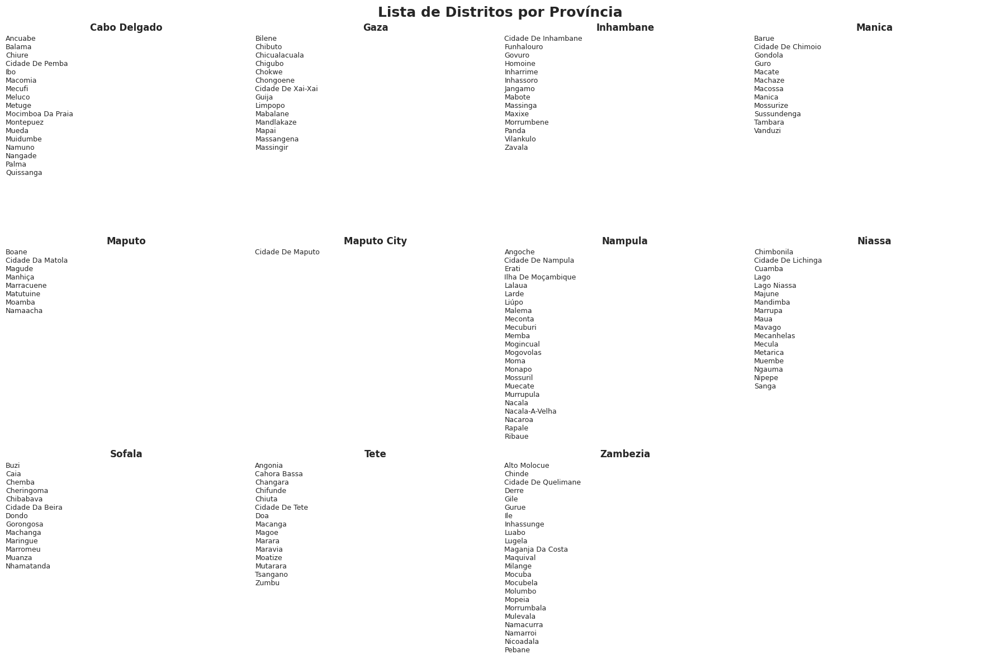

In [204]:
plot_distritos_por_provincia(precipitacao_mensal.copy())

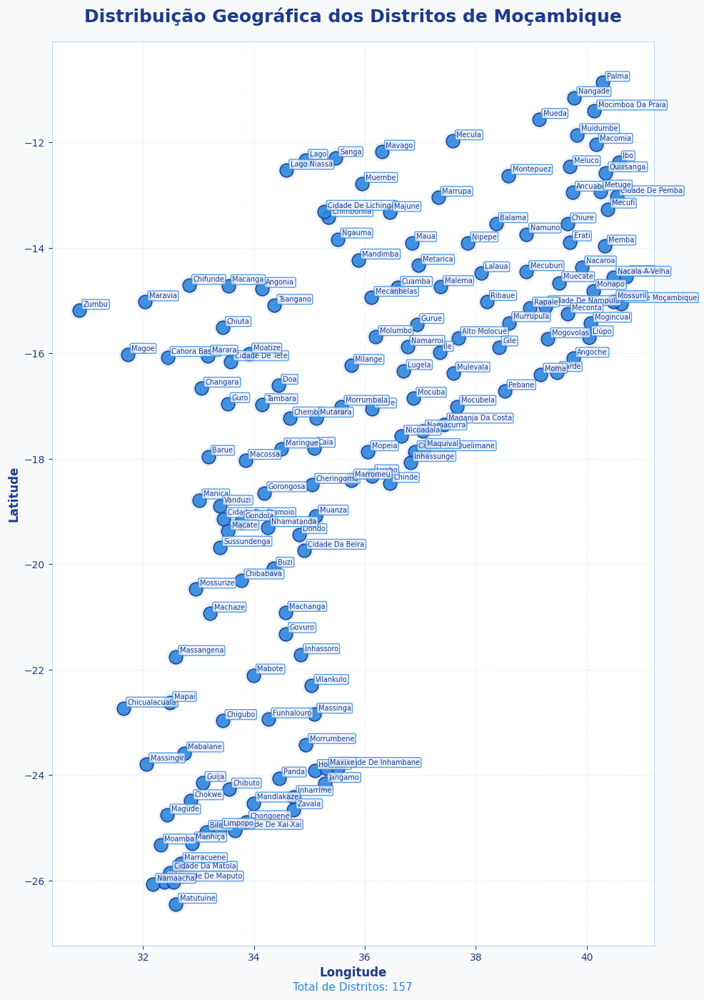

In [205]:
plot_mapa_distritos_claro(precipitacao_mensal.copy())  # Tema claro
# plot_mapa_distritos(precipitacao_mensal.copy())  # Tema escuro

---
### Distritos mais e menos chuvosos por província

In [206]:
resultado, ids_dict = analisar_precipitacao_distritos(precipitacao_mensal.copy())
resultado

,Provincia,Distrito mais chuvoso,Media mensal - D.mais chuvoso (mm),Distrito menos chuvoso,Media mensal - D.menos chuvoso (mm),Diferenca (mm)
0,Cabo Delgado,Nangade,96.60,Cidade De Pemba,67.23,29.37
1,Gaza,Limpopo,72.00,Mapai,42.11,29.89
2,Inhambane,Govuro,73.89,Funhalouro,58.38,15.51
3,Manica,Cidade De Chimoio,97.93,Guro,62.80,35.13
4,Maputo,Manhiça,65.20,Boane,52.57,12.63
5,Maputo City,Cidade De Maputo,60.81,Cidade De Maputo,60.81,0.00
6,Nampula,Murrupula,107.17,Mogincual,65.64,41.53
7,Niassa,Muembe,111.49,Mecula,79.78,31.70
8,Sofala,Cidade Da Beira,121.87,Chemba,59.54,62.32
9,Tete,Tsangano,97.13,Cidade De Tete,53.58,43.55


### Média anual histórica por província

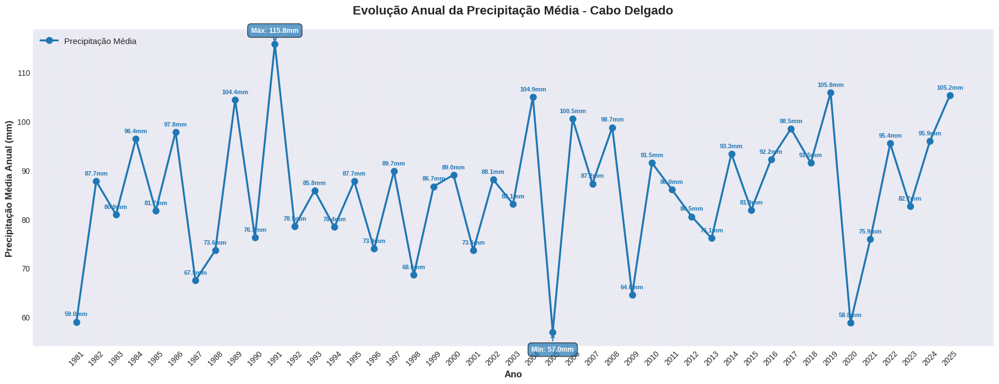

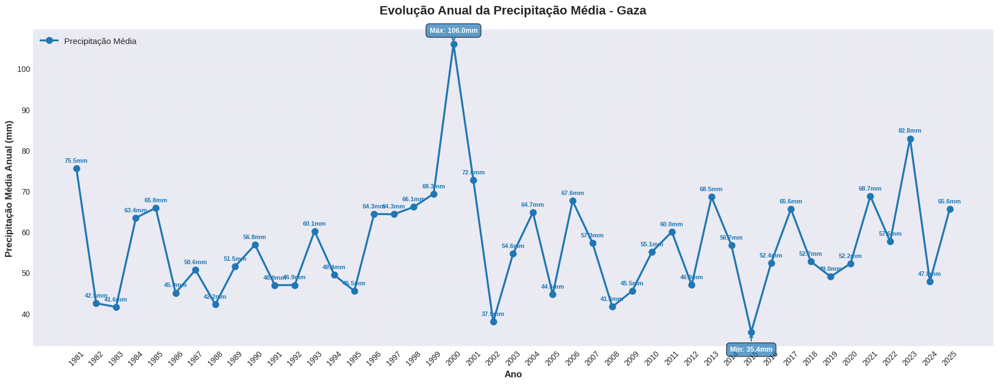

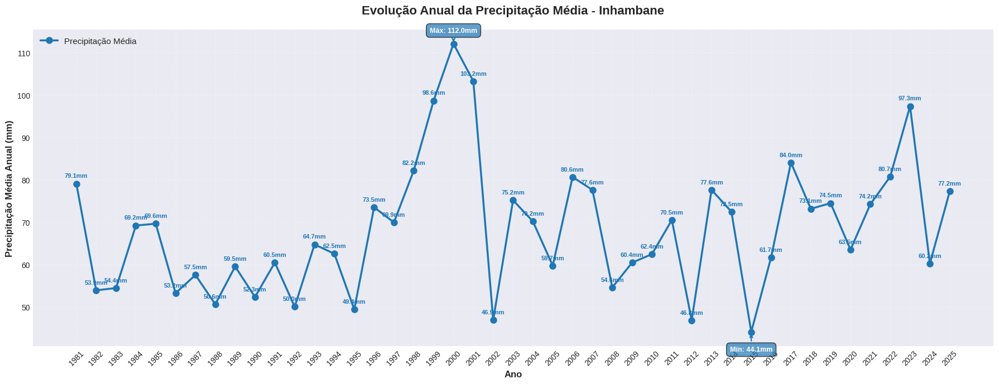

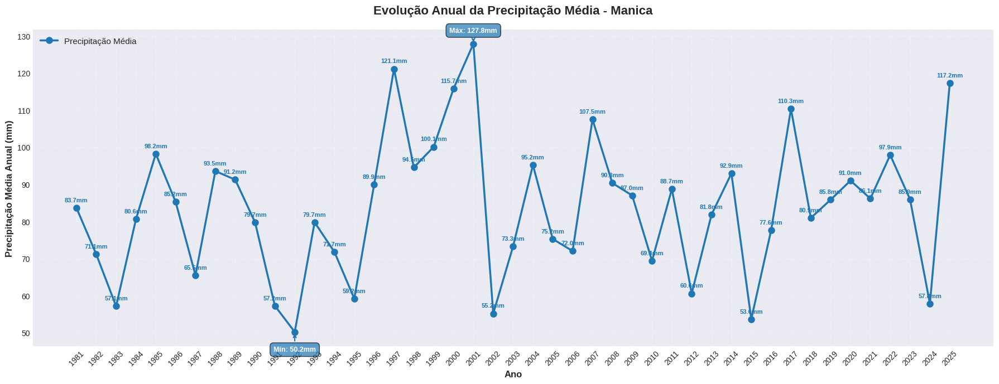

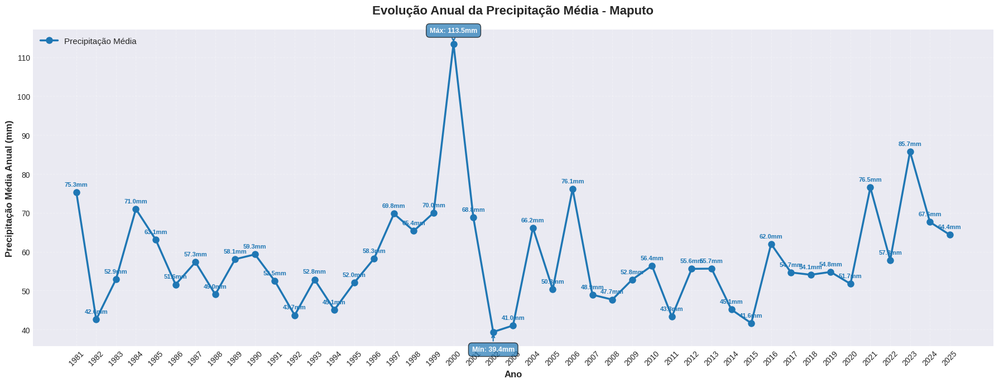

...

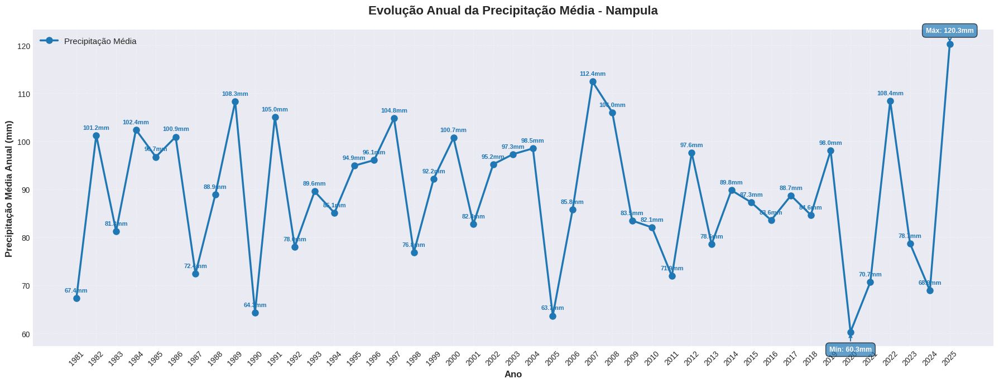

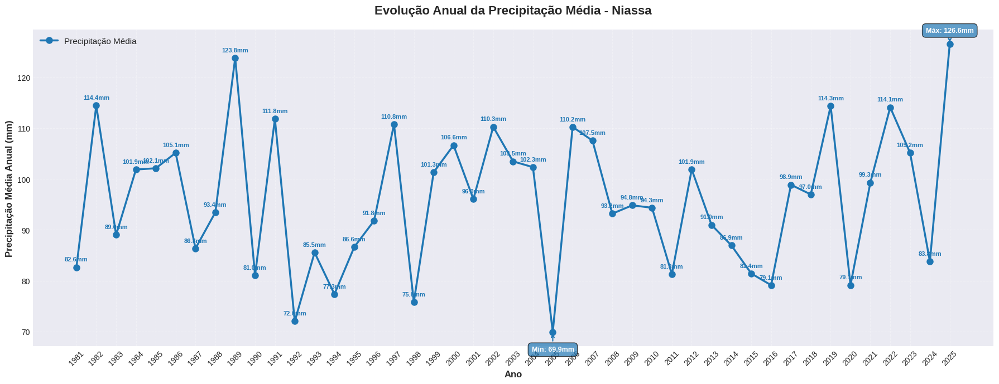

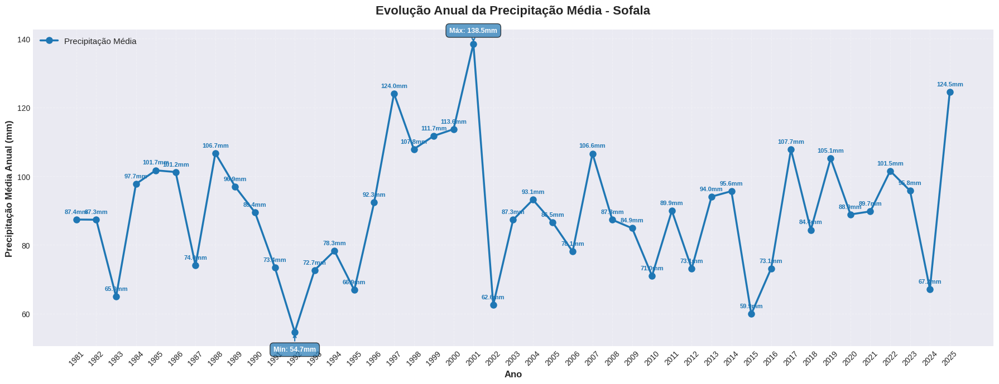

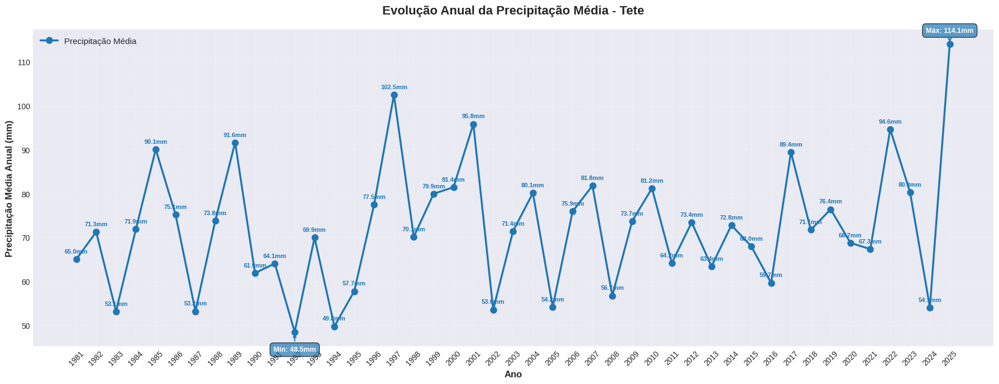

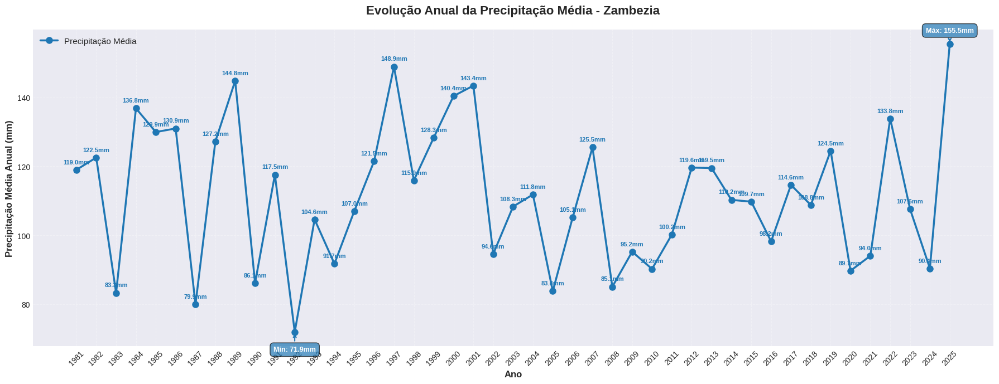

In [207]:
evolucao_chuva_provincia_media(precipitacao_mensal.copy())

----

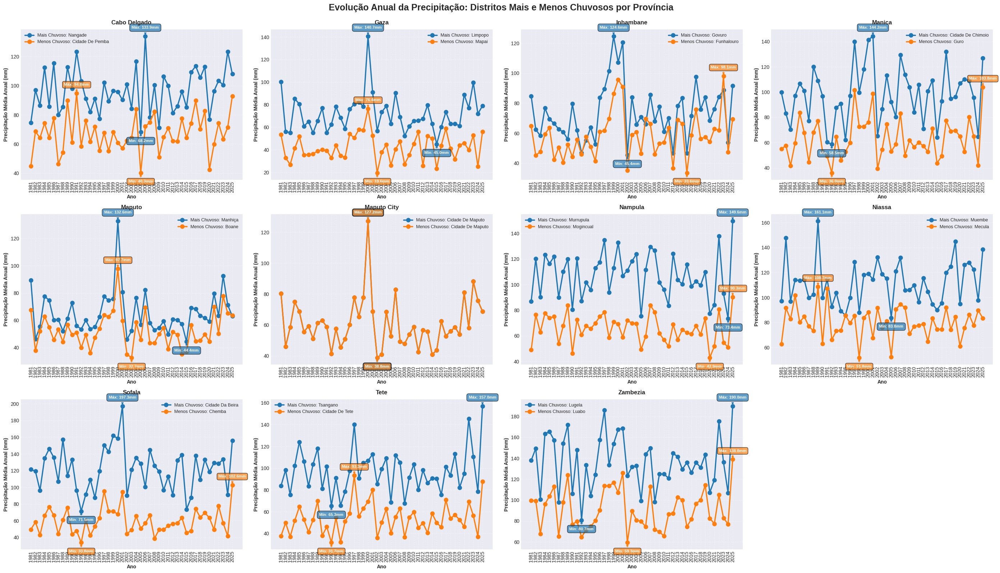

In [208]:
# Plotar a evolução mensal
evolucao_chuva_distritos_prov(precipitacao_mensal.copy(), ids_dict)

---

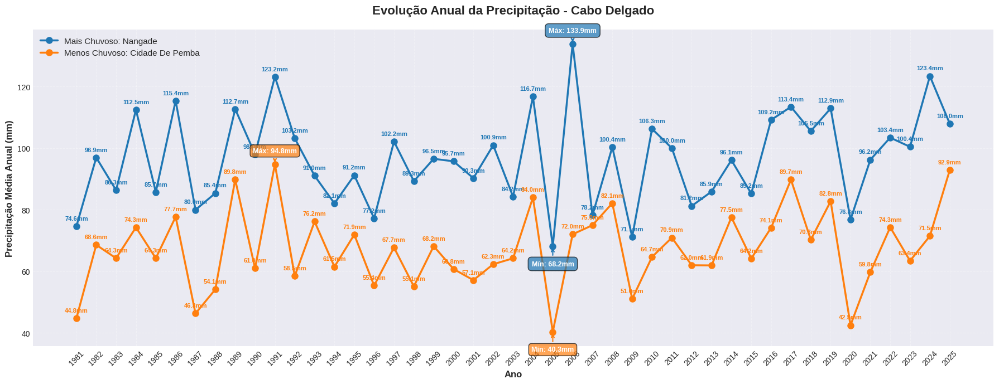

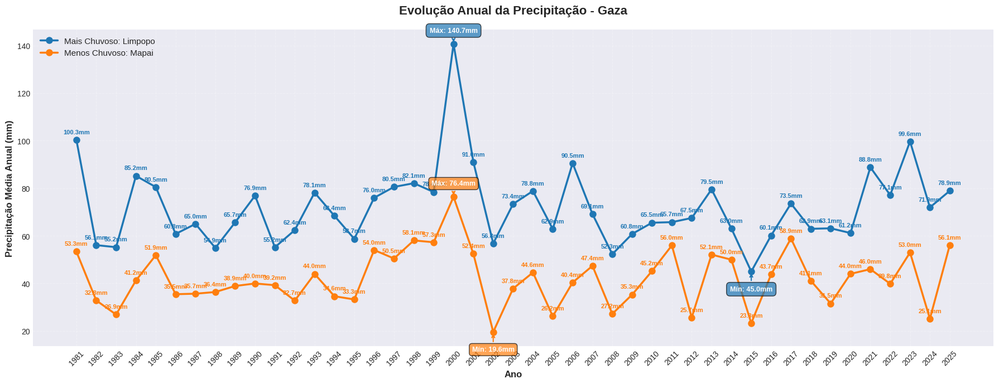

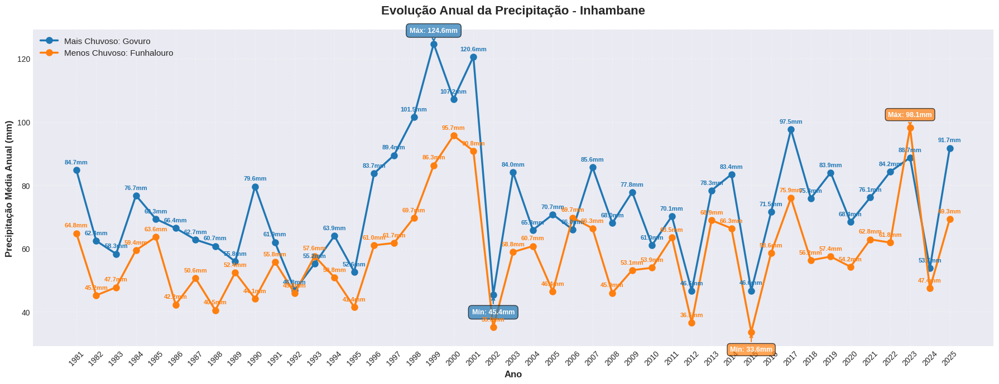

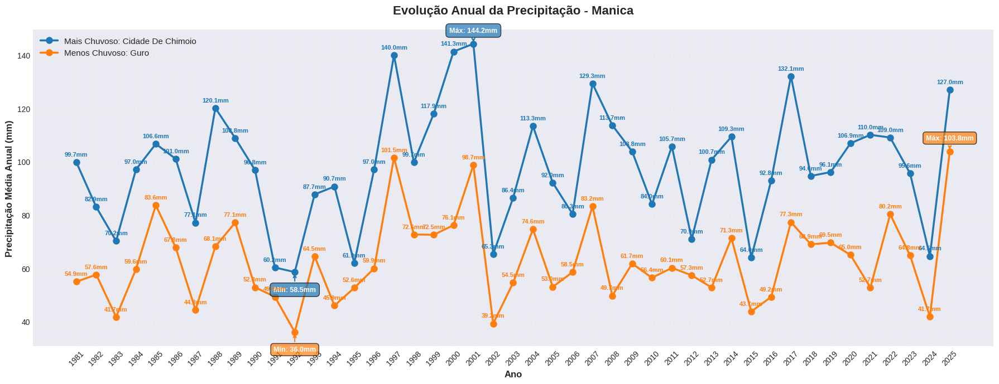

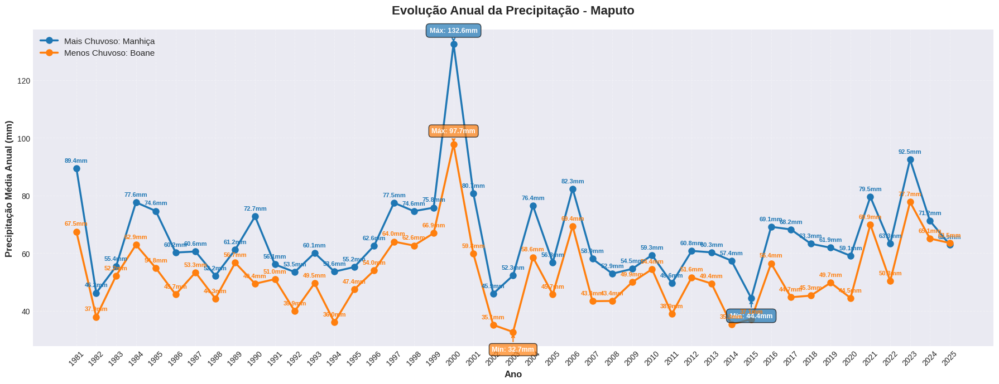

...

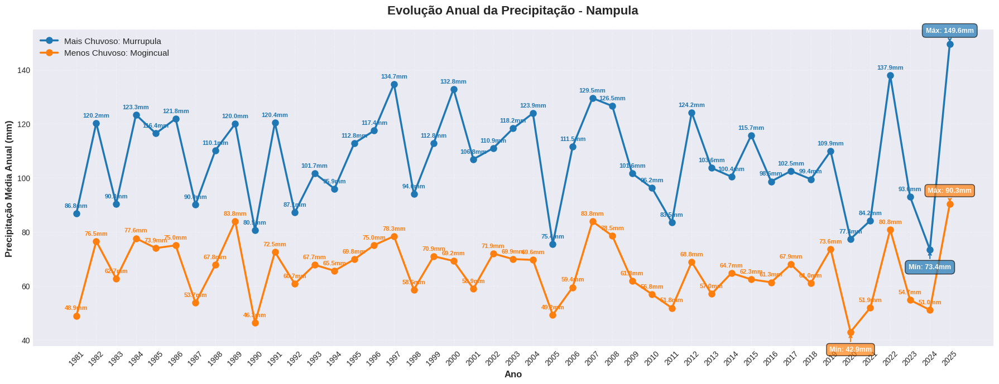

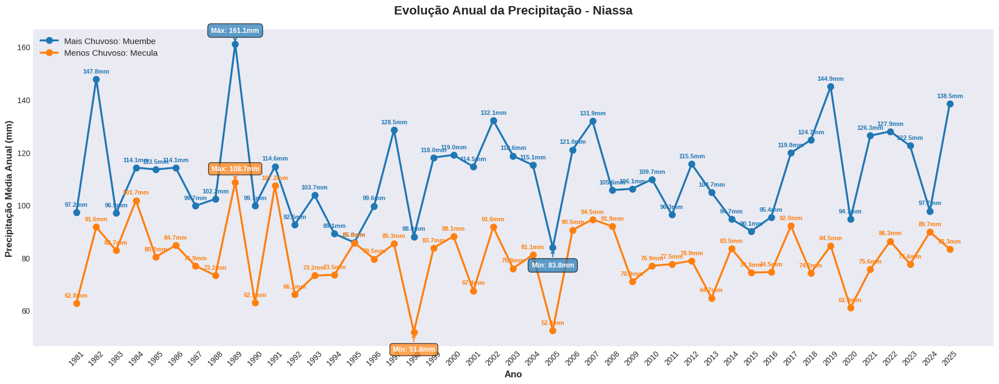

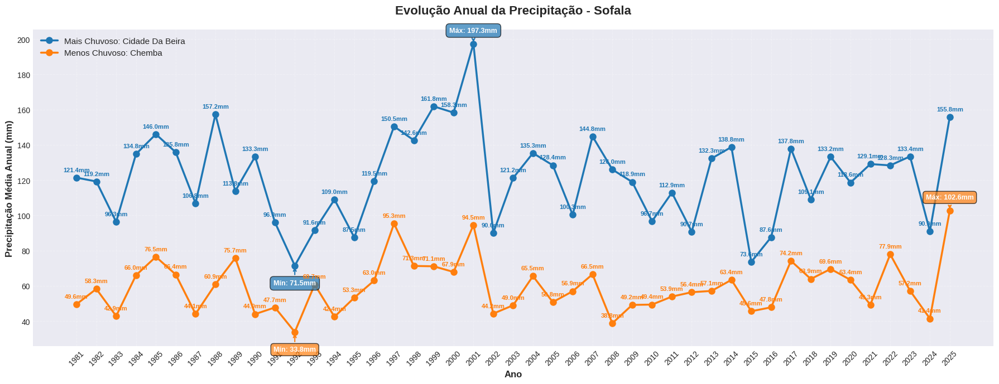

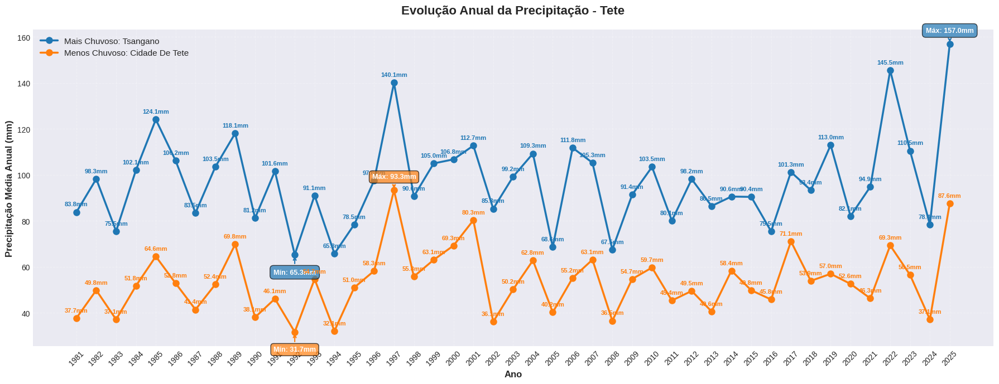

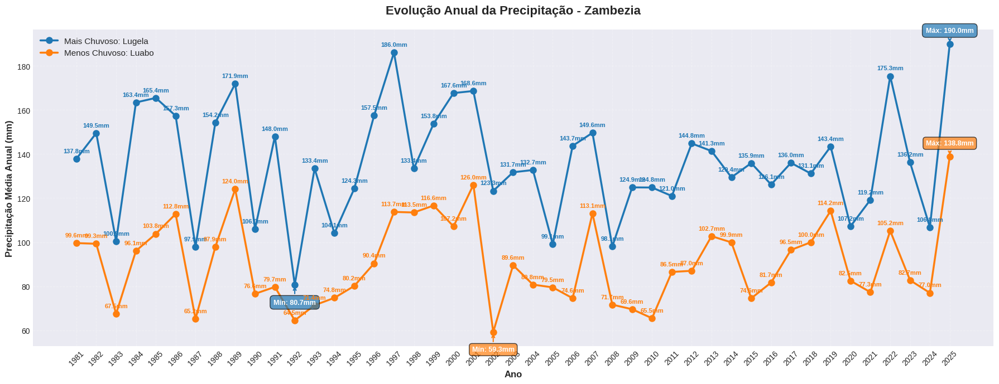

In [209]:
# Plotar a evolução mensal individual
evolucao_chuva_distritos_prov_separados(precipitacao_mensal.copy(), ids_dict)

---
### Linha temporal histórica resumida das principais anomalias em Moçambique

| Ano  | Evento                             | Províncias mais afectadas                        |
| ---- | ---------------------------------- | ------------------------------------------------ |
| 2000 | Ciclone Eline e grandes cheias     | Gaza, Maputo, Inhambane, Sofala e Manica         |
| 2007 | Ciclone Favio e cheias no Zambeze  | Inhambane, Sofala, Manica, Tete e Zambézia       |
| 2008 | Novas cheias no centro do país     | Tete, Sofala, Manica e Zambézia                  |
| 2013 | Cheias severas no rio Limpopo      | Gaza, Maputo e Inhambane                         |
| 2017 | Ciclone Dineo                      | Inhambane, Gaza, Maputo, Sofala e Manica         |
| 2019 | Ciclone Idai                       | Sofala, Manica, Zambézia, Tete e Inhambane       |
| 2019 | Ciclone Kenneth                    | Cabo Delgado e Nampula                           |
| 2020 | Tempestades Chalane e Eloise       | Sofala, Manica, Inhambane, Gaza e Zambézia       |
| 2021 | Ciclone Eloise (impacto principal) | Sofala, Manica, Inhambane, Tete e Zambézia       |
| 2022 | Tempestade Tropical Ana e cheias   | Nampula, Zambézia, Tete, Sofala e Manica         |
| 2023 | Ciclone Freddy e cheias associadas | Zambézia, Sofala, Tete, Nampula, Niassa e Manica |


---
### Correlação

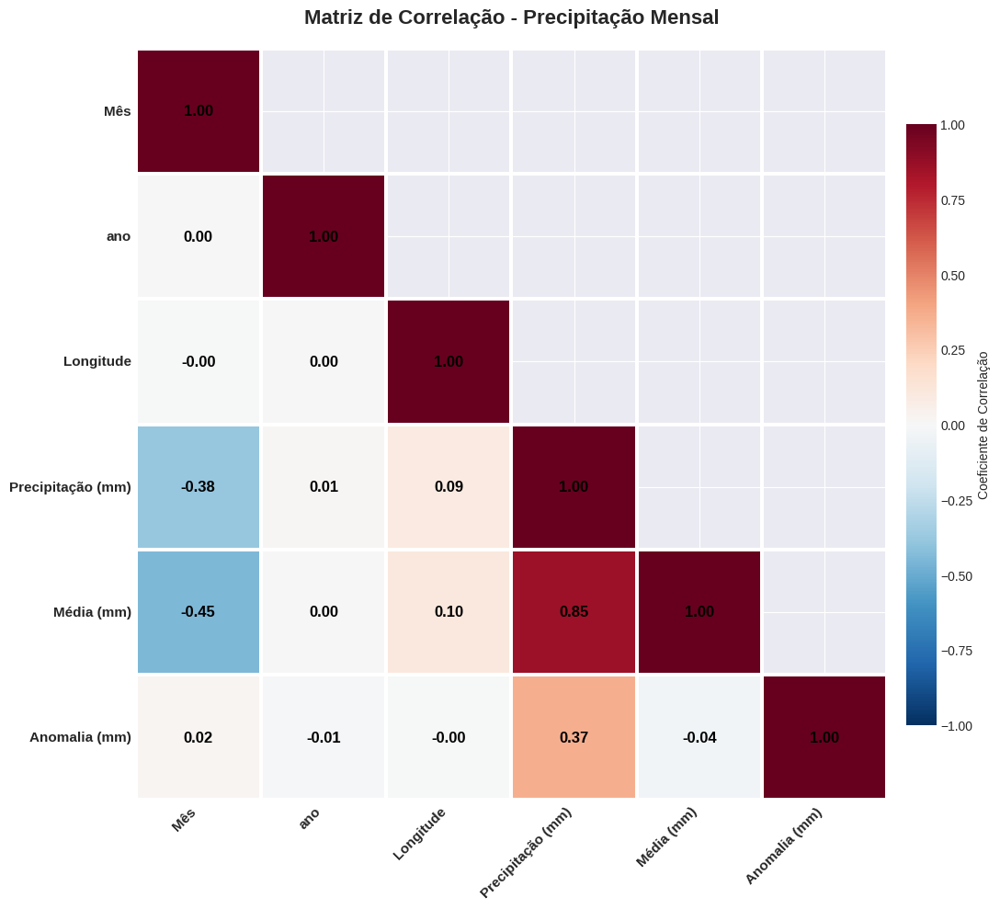

In [210]:
correlacao(precipitacao_mensal.copy())

---
### Distribuição mensal da precipitação

Observa-se um comportamento muito consistente em todas as províncias:

* **Período chuvoso:** Novembro a Março.
* **Pico das chuvas:** Janeiro e Fevereiro.
* **Período seco:** Maio a Setembro.
* **Transição:** Outubro e Novembro marcam o início da estação chuvosa.

Este padrão está associado à migração sazonal da Zona de Convergência Intertropical (ZCIT) e à influência dos sistemas tropicais do Oceano Índico.

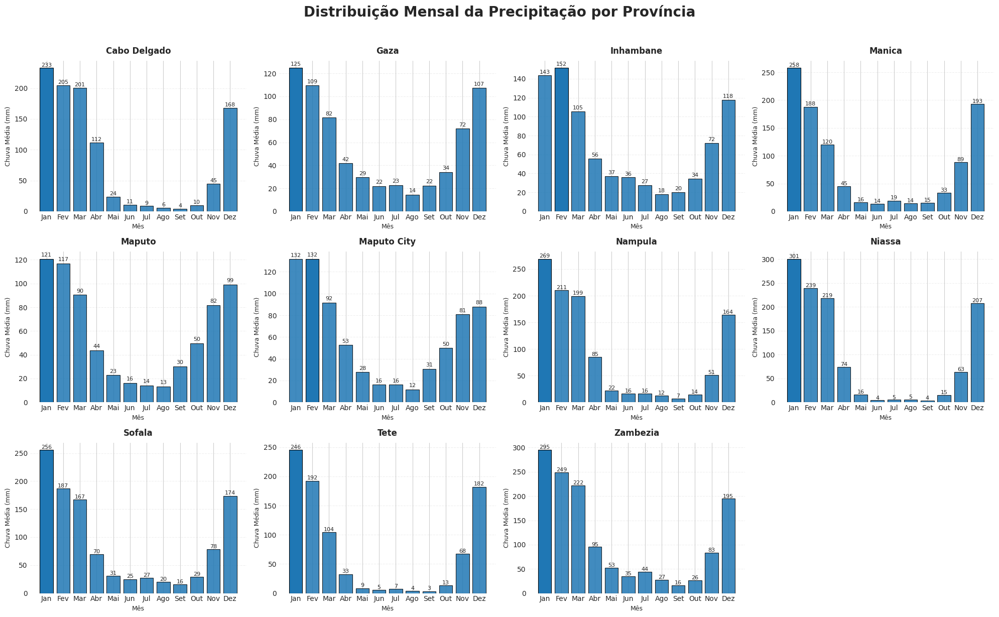

In [211]:
plot_meses_mais_chuvosos_por_provincia(precipitacao_mensal)

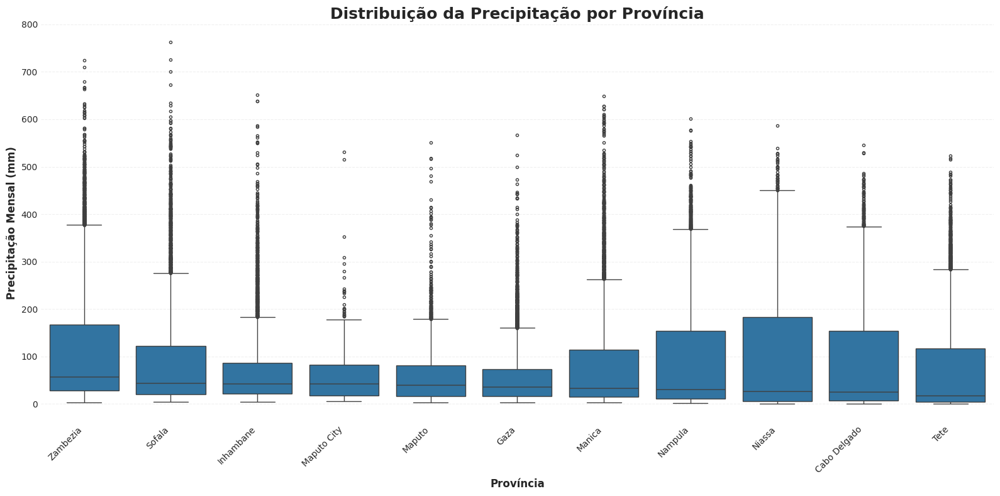

In [212]:
plot_boxplot_chuva_por_provincia(precipitacao_mensal.copy())

---
### Distribuição da média de precipitação por zonas

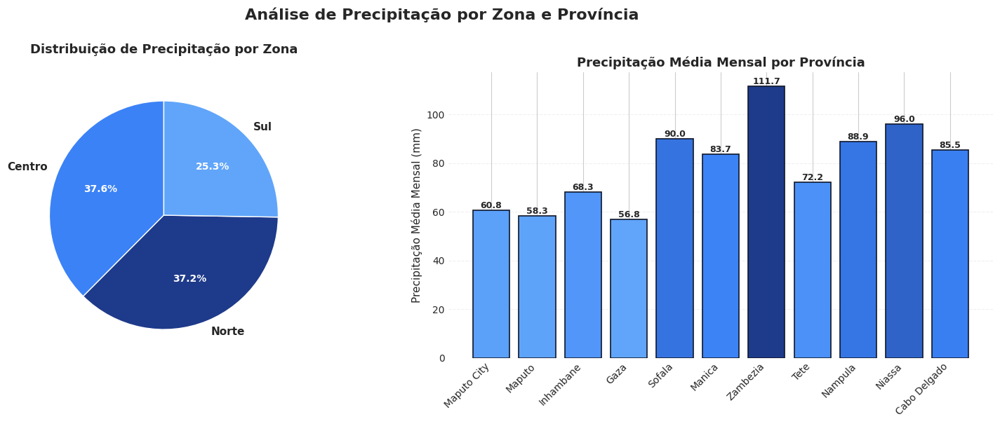

In [213]:
plot_distribuicao_zonas(precipitacao_mensal.copy())

# *V. Modelagem*

In [214]:
df = precipitacao_mensal.copy()

In [215]:
df.head()

,ano,mes,provincia,cod_provincia,distrito,cod_distrito,latitude,longitude,chuva_1m,media_1m,anomalia_1m
2,1981,1,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,123.732400,350.090600,36.25339
5,1981,2,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,324.507020,280.691400,115.33669
8,1981,3,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,237.690120,238.941620,99.48697
11,1981,4,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,99.089200,95.262440,103.81675
14,1981,5,Zambezia,11,Alto Molocue,1101,-15.702819,37.680776,31.314556,33.682785,93.87782


---

### Análise com Regressão Linear e Huber

**Regressão Linear**

A regressão linear é um método estatístico que ajusta uma linha recta aos dados para representar a tendência média ao longo do tempo.

**Exemplo:**

| Ano  | Anomalia de Chuva (mm) |
| ---- | ---------------------- |
| 1981 | 120                    |
| 1982 | 118                    |
| 1983 | 115                    |
| 1984 | 110                    |

A regressão linear permite verificar se as chuvas apresentam uma tendência de aumento ou diminuição ao longo dos anos.

**Porque usamos?**

* Identificar tendências de longo prazo nas chuvas.
* Quantificar a taxa de aumento ou diminuição da precipitação.
* Fornecer uma interpretação simples e intuitiva dos resultados.

**Regressão Huber**

A regressão Huber é semelhante à regressão linear, mas é menos sensível a valores extremos (outliers).

**Exemplo:**

| Ano  | Anomalia de Chuva (mm) |
| ---- | ---------------------- |
| 1981 | 120                    |
| 1982 | 118                    |
| 1983 | 115                    |
| 1984 | 250                    |

O valor **250 mm** pode corresponder a um evento climático excepcional, como uma cheia, ciclone ou fenómeno extremo.

* A regressão linear pode ser fortemente influenciada por esse valor.
* A regressão Huber reduz o peso desse evento extremo e estima uma tendência mais representativa do comportamento geral da série.

**Porque usamos?**

* Séries climáticas frequentemente contêm eventos extremos.
* Reduz o impacto de anos atípicos na análise.
* Produz estimativas mais robustas da tendência climática.

Na nossa análise, quando ambos os modelos apresentam resultados semelhantes, aumenta a confiança de que a tendência observada representa uma mudança real no regime de chuvas e não apenas o efeito de alguns anos excepcionais.


Treinando modelos...

✓ Modelos treinados com sucesso

Gerando visualizações...

✓ Gráfico salvo: 'analise_tendencia_temporal.png'


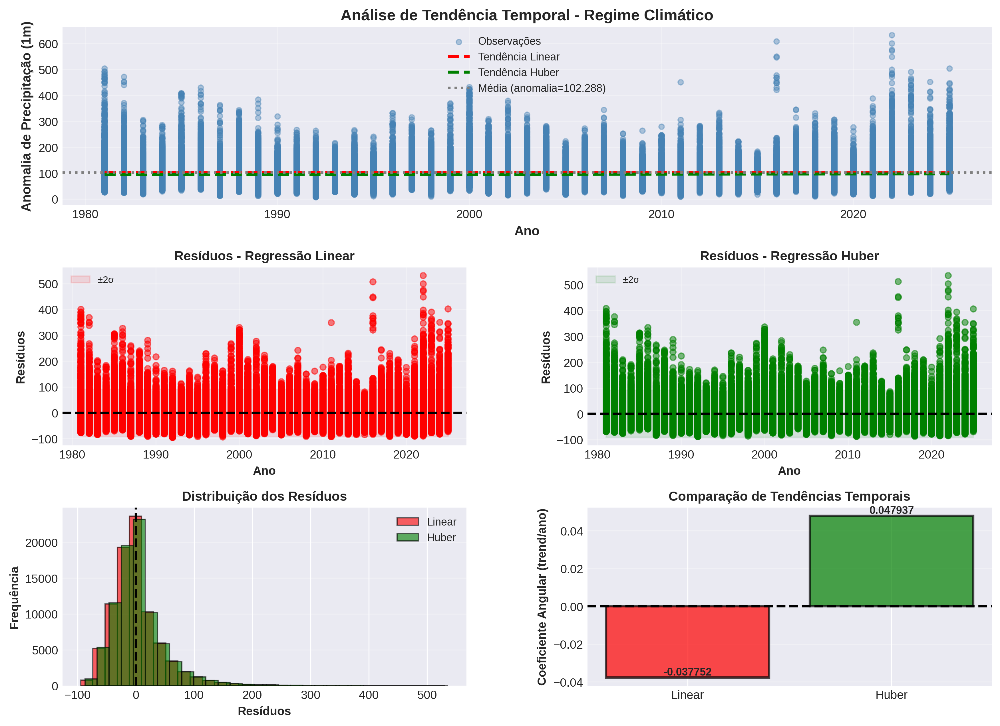


RELATÓRIO DE ANÁLISE - REGIME CLIMÁTICO

Regressão Linear:
  R² = 0.0001
  RMSE = 45.3212
  MAE = 31.2197
  p-value = 0.0646 (NÃO significativo)

Regressão Huber:
  R² = -0.0195
  RMSE = 45.7641
  MAE = 30.5400
  p-value = 0.0646 (NÃO significativo)

CONCLUSÕES

1. TENDÊNCIA TEMPORAL:
   • Linear: -0.03775236 anomalia/ano
   • Huber:  0.04793652 anomalia/ano
   → Ambos coeficientes próximos a ZERO indicam AUSÊNCIA de tendência

2. SIGNIFICÂNCIA ESTATÍSTICA:
   • Linear é significativa? NÃO (p ≥ 0.05)
   • Huber é significativa?  NÃO (p ≥ 0.05)

3. QUALIDADE DO AJUSTE:
   • R² Linear: 0.0001 (explica 0.01% da variação)
   • R² Huber:  -0.0195 (explica -1.95% da variação)

4. ROBUSTEZ:
   → Huber é mais robusto contra outliers (eventos climáticos extremos)

5. INTERPRETAÇÃO FINAL:
   ✓ NÃO há variação significante no regime climático ao longo do período
   ✓ A anomalia de precipitação mantém-se ESTÁVEL no tempo
   ✓ Flutuações observadas são ALEATÓRIAS, não tendem a aumentar/diminuir



In [216]:
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
FIGSIZE = (14, 10)
DPI = 300

# Preparação dos dados
X = df[['ano']].values
y = df['anomalia_1m'].values

# Treina modelos
print("Treinando modelos...")
modelos = treinar_modelos(X, y)
print("\n✓ Modelos treinados com sucesso")

# Visualizações
print("\nGerando visualizações...")
plotar_resultados(df, modelos)

# Relatório
gerar_relatorio(df, modelos)


---
### Teste de Mann-Kendall e Homogeneidade

**Mann-Kendall**

O Teste de Mann-Kendall é um método estatístico não paramétrico utilizado para detectar tendências em séries temporais.

**Exemplo:**

| Ano  | Anomalia de Chuva (mm) |
| ---- | ---------------------- |
| 1981 | 120                    |
| 1982 | 118                    |
| 1983 | 115                    |
| 1984 | 110                    |

Neste caso, o teste pode indicar uma **tendência decrescente** das chuvas ao longo do tempo.

**Porque usamos?**

* Detectar tendências sem assumir distribuição normal dos dados.
* Muito utilizado em estudos climáticos e hidrológicos.
* Identificar se as mudanças observadas são estatisticamente significativas.

**Homogeneidade**

Teste geralmente usado para detectar mudanças abruptas numa série temporal.

**Exemplo:**

| Ano  | Anomalia de Chuva (mm) |
| ---- | ---------------------- |
| 1981 | 120                    |
| 1982 | 118                    |
| 1983 | 116                    |
| 2000 | 90                     |
| 2001 | 88                     |
| 2002 | 85                     |

Neste exemplo, o teste pode identificar uma **mudança de regime** próxima do ano 2000, indicando que o comportamento das chuvas antes e depois desse período é diferente.

**Porque usamos?**

* Detectar pontos de mudança (change points) na série temporal.
* Identificar alterações no regime climático.
* Determinar quando ocorreu uma mudança significativa no padrão das chuvas.

Os resultados fornecem evidências mais robustas de mudanças climáticas locais, permitindo compreender não apenas **se as chuvas estão a mudar**, mas também **quando essa mudança começou a ocorrer**.


---

Neste ponto vamos classificar os **distritos** com e sem tendência significativa, vamos separar e analisar seus *change points* anuais.

</br>

In [217]:
resultados_df = analise_mannkendall(df)

In [218]:
resultados_df.head()

,distrito,trend,p_value,tau,sens_slope,intercept,significativo,classificacao
50,Ibo,increasing,0.018397,0.244444,0.452843,92.368068,Sim,Tendência húmida
143,Palma,increasing,0.019389,0.242424,0.403396,96.718680,Sim,Tendência húmida
109,Mocimboa Da Praia,no trend,0.061703,0.193939,0.374072,95.547790,Não,Sem tendência significativa
122,Mossurize,increasing,0.047054,0.206061,0.369681,95.078573,Sim,Tendência húmida
67,Macanga,no trend,0.173911,0.141414,0.238669,98.299647,Não,Sem tendência significativa


---
Apenas 3 distritos foram classificados como tendo uma tendência **minimamente significativa**.

</br>

In [219]:
resultados_df[resultados_df['significativo'] == 'Sim']


,distrito,trend,p_value,tau,sens_slope,intercept,significativo,classificacao
50,Ibo,increasing,0.018397,0.244444,0.452843,92.368068,Sim,Tendência húmida
143,Palma,increasing,0.019389,0.242424,0.403396,96.718680,Sim,Tendência húmida
122,Mossurize,increasing,0.047054,0.206061,0.369681,95.078573,Sim,Tendência húmida


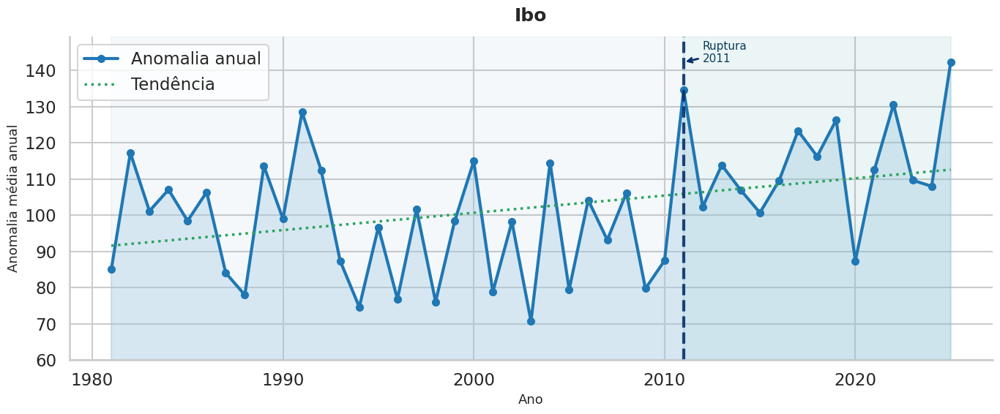

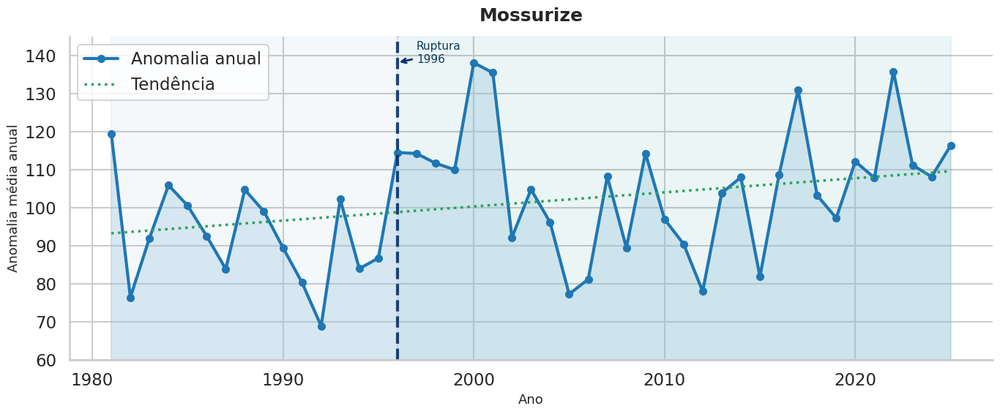

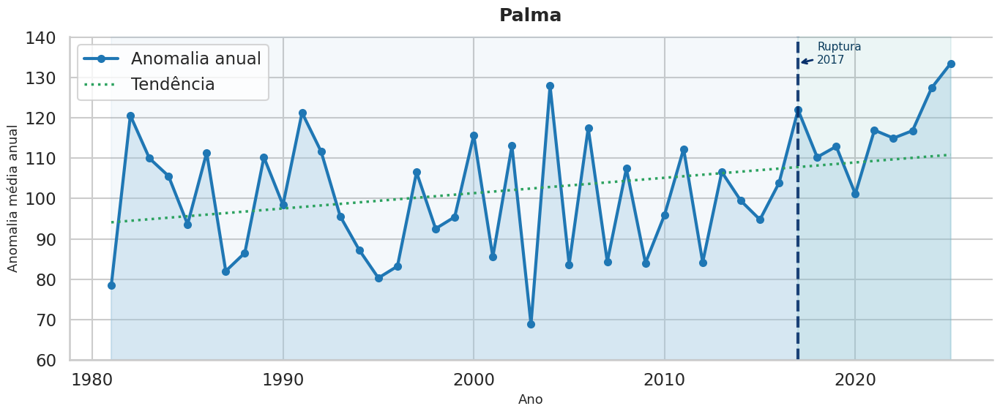

,distrito,ano_mudanca,media_antes,media_depois,diferenca
0,Ibo,2011,95.659699,114.960310,19.300611
1,Mossurize,1996,92.411472,105.932312,13.520840
2,Palma,2017,98.777541,117.339738,18.562196


In [220]:
resultado = detectar_mudancas_climaticas(
    df,
    coluna_anomalia="anomalia_1m",
    alpha=0.05,
    plotar=True
)

resultado["resultado_final"]

resultado["comparacao_df"]

---

# *VI. Conclusão*

Este estudo buscou analisar a evolução da precipitação em Moçambique e identificar possíveis mudanças de regime climático ao nível distrital, utilizando séries temporais de precipitação mensal referentes ao período de 1981 a 2025. A investigação foi motivada pela necessidade de compreender como os padrões de precipitação se comportam ao longo do tempo e se existem evidências estatísticas de alterações climáticas localizadas que possam afectar sectores estratégicos como a agricultura, a gestão de recursos hídricos e a mitigação de desastres naturais. 

---
## Metodologia

* Recolha e integração de dados de precipitação do WFP/HDX e dos limites administrativos distritais da OCHA.
* Realização de procedimentos de qualidade, limpeza, transformação e preparação dos dados, utilizando apenas registos distritais classificados como dados finais.
* Desenvolvimento de uma análise exploratória para caracterizar a distribuição espacial e temporal da precipitação, incluindo a identificação dos distritos mais e menos chuvosos e a avaliação da sazonalidade das chuvas.
* Aplicação de modelos de regressão Linear e Huber para avaliar tendências globais nas anomalias de precipitação.
* Utilização do teste de Mann-Kendall para detectar tendências climáticas significativas e do teste de Pettitt para identificar mudanças de regime e pontos de ruptura nas séries temporais distritais.

---
## Principais Descobertas

* A precipitação em Moçambique apresenta forte sazonalidade, com a estação chuvosa concentrada entre Novembro e Março e picos de chuva em Janeiro e Fevereiro.
* Existem diferenças significativas entre províncias e distritos, evidenciando elevada variabilidade espacial da precipitação.
* A análise global não identificou tendências estatisticamente significativas nas anomalias de precipitação, sugerindo estabilidade do regime pluviométrico nacional ao longo do período analisado.
* Ao nível distrital, apenas Ibo, Palma e Mossurize apresentaram tendências minimamente significativas de aumento da precipitação.
* Os testes de Pettitt indicaram mudanças de regime climático nesses distritos, com rupturas identificadas em 1996 (Mossurize), 2011 (Ibo) e 2017 (Palma), seguidas por aumentos na precipitação média.

---
## Limitações do Estudo

* O estudo considerou apenas a precipitação, sem incluir outras variáveis climáticas relevantes, como temperatura, humidade relativa, evapotranspiração e índices oceânicos.
* Os dados utilizados são provenientes de produtos satelitais e modelos climáticos, podendo apresentar diferenças em relação às observações de estações meteorológicas.
* A análise baseou-se principalmente em métodos univariados, que não capturam totalmente as interacções entre diferentes factores climáticos e ambientais.

---
## Recomendações para Pesquisas Futuras

* Incluir outras variáveis climáticas, como temperatura, humidade relativa e evapotranspiração, para uma análise mais abrangente das mudanças climáticas.
* Integrar dados de estações meteorológicas nacionais para complementar e validar os resultados obtidos a partir de produtos satelitais.
* Investigar a influência de fenómenos climáticos de grande escala, como o El Niño, o Dipolo do Oceano Índico e a Zona de Convergência Intertropical, nos padrões de precipitação observados.
* Desenvolver modelos preditivos para os distritos com mudanças de regime identificadas, apoiando sistemas de alerta precoce e estratégias de adaptação climática.

---

**Em síntese**, conclui-se que os padrões de precipitação em Moçambique permanecem globalmente estáveis quando analisados de forma agregada. Contudo, a existência de mudanças significativas em distritos específicos demonstra que processos de alteração climática local já estão em curso em determinadas regiões do país. 